# Step 5


In [42]:
import pandas as pd
import numpy as np
import pydot
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.patches import Circle, ConnectionPatch
import graphviz
import networkx as nx
from networkx.drawing.nx_pydot import from_pydot
from collections import deque
import os
import math
import random
import re
from pathlib import Path
import matplotlib.cm as cm
from matplotlib.patches import Polygon, Patch, Rectangle
from scipy.spatial import ConvexHull

In [44]:
#names of the dot files that contain the data:
data_name_1 = "../Dataset/JazzNetwork.dot"
data_name_2 = "../Dataset/LesMiserables.dot"
data_name_3 = "../Dataset/devonshiredebate_withclusters.dot"
data_name_4 = "../Dataset/g.20.27.dot"
data_name_5 = "../Dataset/g.42.88.dot"
data_name_6 = "../Dataset/GD97.dot"
data_name_7 = "../Dataset/LeagueNetwork.dot" #
data_name_8 = "../Dataset/mesh graph.dot"
data_name_9 = "../Dataset/noname.dot" #
data_name_10 = "../Dataset/polblogs.dot"
data_name_11 = "../Dataset/robot graph.dot"
data_name_12 = "../Dataset/rome.dot"
data_name_13 = "../Dataset/snail graph.dot"

In [45]:
def process_dot_file_for_subgraphs(file_path, subgraph_names):
    """
    Process a DOT file and extract specified subgraphs.
    
    Parameters:
    -----------
    file_path : str
        Path to the DOT file
    subgraph_names : list
        List of subgraph names to extract
        
    Returns:
    --------
    dict
        Dictionary with:
        - 'subgraphs': Dict mapping subgraph name to list of nodes with attributes
        - 'edges': List of edge tuples (source, target, attributes)
    """
    # Parse the DOT file
    dot_graphs = pydot.graph_from_dot_file(file_path)
    dot_graph = dot_graphs[0]  # Assume there's only one main graph
    
    # Process subgraphs
    subgraphs = {}
    subgraph_objects = {}
    
    # Extract all subgraphs
    for subgraph in dot_graph.get_subgraphs():
        name = subgraph.get_name().strip('"')
        if name in subgraph_names:
            subgraphs[name] = []
            subgraph_objects[name] = subgraph
            
            # Process nodes in this subgraph
            for node in subgraph.get_nodes():
                node_id = node.get_name().strip('"')
                attrs = {k: v.strip('"') for k, v in node.get_attributes().items()}
                # Add node with its attributes
                subgraphs[name].append((node_id, attrs))
    
    # Extract node IDs for edge filtering
    all_nodes = set()
    for name in subgraphs:
        for node_id, _ in subgraphs[name]:
            all_nodes.add(node_id)
    
    # Extract edges where both endpoints are in the included subgraphs
    edges = []
    for edge in dot_graph.get_edges():
        source = edge.get_source().strip('"')
        target = edge.get_destination().strip('"')
        
        if source in all_nodes and target in all_nodes:
            attrs = {k: v.strip('"') for k, v in edge.get_attributes().items()}
            edges.append((source, target, attrs))
    
    return {
        'subgraphs': subgraphs,
        'edges': edges
    }

def draw_colorful_FDG_FR_inertia_subgraphs(
    subgraphs_data, 
    output_name=None, 
    iterations=100, 
    C=1.0,
    inertia=0.8, 
    save_frames=False, 
    output_dir="Output_subgraphs", 
    subgraph_names=None,
    convergence_threshold=0.001, 
    display_node_id=False,
    separation_factor=1.5,  # Controls overall scale
    subgraph_spacing=0.5    # Controls space BETWEEN subgraphs
):
    """
    Draw a force-directed graph layout with subgraphs placed in different regions,
    with each subgraph running its own force-directed layout until convergence.
    
    Parameters:
    -----------
    subgraphs_data : dict
        Dictionary with 'subgraphs' and 'edges' as returned by process_dot_file_for_subgraphs
    output_name : str, optional
        Path to save the final output image
    iterations : int, optional
        Maximum number of iterations for the algorithm
    C : float, optional
        Force constant scaling factor
    inertia : float, optional
        Inertia factor (0-1) for movement damping
    save_frames : bool, optional
        Whether to save intermediate frames
    output_dir : str, optional
        Base directory to save frames
    subgraph_names : list, optional
        List of subgraph names (used for creating subfolder)
    convergence_threshold : float, optional
        Threshold for considering the layout converged
    display_node_id : bool, optional
        Whether to display node IDs
    separation_factor : float, optional
        Controls the overall scale of the visualization
    subgraph_spacing : float, optional
        Controls the space between subgraphs (0.0=touching, 1.0=wide spacing)
    """
    # Extract subgraphs and edges
    subgraphs = subgraphs_data['subgraphs']
    edges_data = subgraphs_data['edges']
    
    # Create a subfolder name from subgraph names
    if subgraph_names:
        subfolder_name = "_".join([re.sub(r'[^\w\-_]', '_', name) for name in subgraph_names])
        if len(subfolder_name) > 50:
            subfolder_name = subfolder_name[:47] + "..."
        full_output_dir = os.path.join(output_dir, subfolder_name)
    else:
        full_output_dir = output_dir
    
    # Create output directory if it doesn't exist
    if save_frames and not os.path.exists(full_output_dir):
        os.makedirs(full_output_dir)
    
    # Create a NetworkX graph
    G = nx.DiGraph()
    
    # Track node to subgraph mapping
    node_to_subgraph = {}
    
    # Add nodes with attributes
    for subgraph_name, nodes_data in subgraphs.items():
        for node_id, attrs in nodes_data:
            G.add_node(node_id, **attrs, subgraph=subgraph_name)
            node_to_subgraph[node_id] = subgraph_name
    
    # Add edges with attributes
    for source, target, attrs in edges_data:
        G.add_edge(source, target, **attrs)
    
    # Extract nodes and edges
    nodes = list(G.nodes())
    edges = list(G.edges())
    
    # Total number of nodes
    n = len(nodes)
    
    # Number of subgraphs
    num_subgraphs = len(subgraphs)
    
    # Calculate how many nodes are in each subgraph
    subgraph_node_counts = {name: len(nodes_data) for name, nodes_data in subgraphs.items()}
    
    # Get node degrees and calculate masses
    node_degrees = {node: len(list(G.neighbors(node))) for node in nodes}
    node_masses = {node: 1 + node_degrees[node] / 2 for node in nodes}
    
    # Create colormap for subgraphs
    color_map = {}
    for i, subgraph_name in enumerate(subgraphs.keys()):
        color_map[subgraph_name] = plt.cm.tab10(i % 10)
    
    # Calculate base size for subgraph regions based on node counts
    total_nodes = sum(subgraph_node_counts.values())
    base_region_size = math.sqrt(n) / 4 * separation_factor
    
    # Determine canvas divisions based on subgraph count
    if num_subgraphs <= 1:
        grid_rows = grid_cols = 1
    elif num_subgraphs <= 2:
        grid_rows = 1
        grid_cols = 2
    elif num_subgraphs <= 4:
        grid_rows = grid_cols = 2
    else:
        grid_rows = grid_cols = math.ceil(math.sqrt(num_subgraphs))
    
    # Calculate subgraph region sizes proportionally to their node count
    # Ensure every subgraph gets at least a minimum size
    min_region_size = base_region_size * 0.5
    subgraph_sizes = {}
    for name, count in subgraph_node_counts.items():
        size = max(min_region_size, base_region_size * math.sqrt(count / max(1, total_nodes/num_subgraphs)))
        subgraph_sizes[name] = size
    
    # Calculate total width and height needed with spacing
    max_width_per_col = [0] * grid_cols
    max_height_per_row = [0] * grid_rows
    
    # Assign positions in grid and track max dimensions
    idx = 0
    subgraph_positions = {}
    for name, size in subgraph_sizes.items():
        row = idx // grid_cols
        col = idx % grid_cols
        subgraph_positions[name] = {'row': row, 'col': col, 'size': size}
        
        max_width_per_col[col] = max(max_width_per_col[col], size)
        max_height_per_row[row] = max(max_height_per_row[row], size)
        idx += 1
    
    # Calculate spacing between regions
    spacing_x = base_region_size * subgraph_spacing
    spacing_y = base_region_size * subgraph_spacing
    
    # Calculate total canvas dimensions
    total_width = sum(max_width_per_col) + spacing_x * (grid_cols - 1)
    total_height = sum(max_height_per_row) + spacing_y * (grid_rows - 1)
    
    # Now calculate actual positions with spacing
    x_offsets = [0] * grid_cols
    y_offsets = [0] * grid_rows
    running_x = 0
    for i in range(grid_cols):
        x_offsets[i] = running_x
        running_x += max_width_per_col[i] + spacing_x
    
    running_y = 0
    for i in range(grid_rows):
        y_offsets[i] = running_y
        running_y += max_height_per_row[i] + spacing_y
    
    # Assign final regions to each subgraph
    subgraph_regions = {}
    for name, pos_data in subgraph_positions.items():
        row = pos_data['row']
        col = pos_data['col']
        size = pos_data['size']
        
        # Calculate center position
        center_x = x_offsets[col] + max_width_per_col[col] / 2
        center_y = y_offsets[row] + max_height_per_row[row] / 2
        
        # Define region boundaries
        x_min = center_x - size/2
        y_min = center_y - size/2
        x_max = center_x + size/2
        y_max = center_y + size/2
        
        subgraph_regions[name] = {
            'x_min': x_min, 'x_max': x_max,
            'y_min': y_min, 'y_max': y_max,
            'center': (center_x, center_y),
            'width': size,
            'height': size,
            'radius': size / 2
        }
    
    # SCALING: Adjust figure size 
    fig_width = max(10, min(24, 8 + math.sqrt(n)))
    fig_height = max(8, min(20, 6 + math.sqrt(n)))
    
    # SCALING: Calculate node size and font size based on total nodes
    node_size = max(30, min(500, 800 / math.sqrt(n)))
    font_size = max(4, min(12, 14 / math.sqrt(n)))
    edge_width = max(0.5, min(5, 5 / math.sqrt(n)))
    
    # Set view limits for the entire canvas with padding
    view_padding = base_region_size * 0.1
    view_x_min = -view_padding
    view_y_min = -view_padding
    view_x_max = total_width + view_padding
    view_y_max = total_height + view_padding
    
    # Optimal force constant per subgraph
    subgraph_l = {}
    for name, nodes_data in subgraphs.items():
        subgraph_n = len(nodes_data)
        region = subgraph_regions[name]
        region_area = region['width'] * region['height']
        subgraph_l[name] = C * math.sqrt(region_area / max(1, subgraph_n))
    
    # Group edges by subgraph
    subgraph_edges = {name: [] for name in subgraphs.keys()}
    cross_subgraph_edges = []
    
    for u, v in edges:
        u_subgraph = node_to_subgraph[u]
        v_subgraph = node_to_subgraph[v]
        
        if u_subgraph == v_subgraph:
            subgraph_edges[u_subgraph].append((u, v))
        else:
            cross_subgraph_edges.append((u, v))
    
    # Group nodes by subgraph
    subgraph_nodes = {name: [node_id for node_id, _ in data] for name, data in subgraphs.items()}
    
    # Initialize node positions within their assigned regions
    pos = {}
    for node in nodes:
        subgraph_name = node_to_subgraph[node]
        region = subgraph_regions[subgraph_name]
        
        # Random position within the region
        x = random.uniform(region['x_min'], region['x_max'])
        y = random.uniform(region['y_min'], region['y_max'])
        pos[node] = np.array([x, y])
    
    # Variables for tracking inertia
    velocities = {node: np.array([0.0, 0.0]) for node in nodes}
    
    # Prepare the figure and set fixed bounds
    plt.figure(figsize=(fig_width, fig_height))
    
    # Track convergence for each subgraph
    subgraph_converged = {name: False for name in subgraphs.keys()}
    max_movement_by_subgraph = {name: float('inf') for name in subgraphs.keys()}
    
    # Frame counter
    frame_count = 0
    
    # Initial plot to set the view bounds
    plt.clf()
    plt.xlim(view_x_min, view_x_max)
    plt.ylim(view_y_min, view_y_max)
    
    # Draw region boundaries
    for subgraph_name, region in subgraph_regions.items():
        color = color_map[subgraph_name]
        rect = Rectangle(
            (region['x_min'], region['y_min']),
            region['width'], region['height'],
            fill=True, alpha=0.1, linewidth=2,
            edgecolor=color, facecolor=color, zorder=0
        )
        plt.gca().add_patch(rect)
    
    # Draw initial positions
    for node in nodes:
        subgraph_name = node_to_subgraph[node]
        node_color = color_map[subgraph_name]
        plt.scatter(pos[node][0], pos[node][1], s=node_size, color=node_color, edgecolor='black', zorder=2)
    
    plt.title("Initial Layout")
    plt.axis('off')
    plt.tight_layout()
    
    # Save initial frame
    if save_frames:
        frame_path = os.path.join(full_output_dir, f"subgraph_layout_iter_0000.png")
        plt.savefig(frame_path, dpi=150)
    
    plt.pause(0.1)  # Pause to allow the GUI to update
    
    # Main layout loop - run until all subgraphs converge or max iterations reached
    iteration = 0
    while iteration < iterations and not all(subgraph_converged.values()):
        iteration += 1
        
        # Process each subgraph independently if not yet converged
        for subgraph_name in subgraphs.keys():
            if subgraph_converged[subgraph_name]:
                continue  # Skip subgraphs that have already converged
            
            # Initial temperature per subgraph
            t = 0.1 * (0.95 ** iteration)  # Cooling schedule
            
            # Get nodes and edges for this subgraph
            sg_nodes = subgraph_nodes[subgraph_name]
            sg_edges = subgraph_edges[subgraph_name]
            region = subgraph_regions[subgraph_name]
            l = subgraph_l[subgraph_name]
            
            # Skip if no nodes
            if not sg_nodes:
                subgraph_converged[subgraph_name] = True
                continue
            
            # Save previous positions for this subgraph
            prev_pos = {node: np.copy(pos[node]) for node in sg_nodes}
            
            # Initialize force vectors for this subgraph
            f_total = {node: np.array([0.0, 0.0]) for node in sg_nodes}
            
            # PHASE 1: Calculate REPULSIVE forces within subgraph
            for u in sg_nodes:
                for v in sg_nodes:
                    if u != v:
                        # Vector from u to v
                        delta = pos[v] - pos[u]
                        
                        # Euclidean distance (prevent division by zero)
                        distance = max(0.01, np.linalg.norm(delta))
                        
                        # Calculate repulsive force
                        repulsive_magnitude = (l * l) / distance
                        
                        # Direction
                        direction = delta / distance
                        
                        # Apply repulsive force
                        f_total[u] -= direction * repulsive_magnitude / node_masses[u]
            
            # PHASE 2: Calculate ATTRACTIVE forces within subgraph
            for u, v in sg_edges:
                # Vector from u to v
                delta = pos[v] - pos[u]
                
                # Euclidean distance
                distance = max(0.01, np.linalg.norm(delta))
                
                # Calculate attractive force
                attractive_magnitude = (distance * distance) / l
                
                # Direction
                direction = delta / distance
                
                # Apply attraction to both nodes
                f_total[u] += direction * attractive_magnitude / node_masses[u]
                f_total[v] -= direction * attractive_magnitude / node_masses[v]
            
            # PHASE 3: Add containment forces to keep nodes within their region
            containment_strength = 10.0  # Strong containment force
            for node in sg_nodes:
                # Calculate distance to region boundaries
                x, y = pos[node]
                
                # Apply forces to keep node within the region
                if x < region['x_min']:
                    force = region['x_min'] - x
                    f_total[node][0] += containment_strength * force
                if x > region['x_max']:
                    force = region['x_max'] - x
                    f_total[node][0] += containment_strength * force
                    
                if y < region['y_min']:
                    force = region['y_min'] - y
                    f_total[node][1] += containment_strength * force
                if y > region['y_max']:
                    force = region['y_max'] - y
                    f_total[node][1] += containment_strength * force
                
                # Also add a light gravity towards center
                center_x, center_y = region['center']
                dx = center_x - x
                dy = center_y - y
                distance = max(0.01, math.sqrt(dx*dx + dy*dy))
                
                # Weak gravity toward center (stronger if near edges)
                edge_proximity = min(
                    abs(x - region['x_min']),
                    abs(x - region['x_max']),
                    abs(y - region['y_min']),
                    abs(y - region['y_max'])
                ) / min(region['width'], region['height'])
                
                gravity_strength = 0.03 * (1 + (1 - min(1, edge_proximity)) * 2)
                
                f_total[node][0] += gravity_strength * dx
                f_total[node][1] += gravity_strength * dy
            
            # PHASE 4: Update positions with inertia for this subgraph
            for node in sg_nodes:
                # Calculate new velocity with inertia
                new_velocity = inertia * velocities[node] + (1 - inertia) * (t * f_total[node])
                velocities[node] = new_velocity
                
                # Update position based on velocity
                pos[node] = pos[node] + velocities[node]
                
                # Hard boundary enforcement
                pos[node][0] = max(region['x_min'], min(region['x_max'], pos[node][0]))
                pos[node][1] = max(region['y_min'], min(region['y_max'], pos[node][1]))
            
            # Calculate maximum movement for this subgraph
            movements = [np.linalg.norm(pos[node] - prev_pos[node]) for node in sg_nodes]
            max_movement = max(movements) if movements else 0
            max_movement_by_subgraph[subgraph_name] = max_movement
            
            # Check if this subgraph has converged
            if max_movement <= convergence_threshold:
                subgraph_converged[subgraph_name] = True
                print(f"Subgraph '{subgraph_name}' converged at iteration {iteration} with max movement {max_movement:.6f}")
        
        # Draw the graph at intervals or when a subgraph converges
        if iteration % 10 == 0 or any(not converged for converged in subgraph_converged.values()):
            frame_count += 1
            plt.clf()
            
            # Set fixed axis limits to maintain consistent zoom
            plt.xlim(view_x_min, view_x_max)
            plt.ylim(view_y_min, view_y_max)
            
            # Draw region boundaries
            for subgraph_name, region in subgraph_regions.items():
                color = color_map[subgraph_name]
                rect = Rectangle(
                    (region['x_min'], region['y_min']),
                    region['width'], region['height'],
                    fill=True, alpha=0.1, linewidth=2,
                    edgecolor=color, facecolor=color, zorder=0
                )
                plt.gca().add_patch(rect)
            
            # Draw subgraph convex hulls
            for subgraph_name, sg_node_list in subgraph_nodes.items():
                if sg_node_list:
                    # Get positions of all nodes in this subgraph
                    x_coords = [pos[node][0] for node in sg_node_list]
                    y_coords = [pos[node][1] for node in sg_node_list]
                    
                    if x_coords and y_coords and len(x_coords) > 2:
                        try:
                            # Calculate the convex hull
                            points = np.vstack((x_coords, y_coords)).T
                            hull = ConvexHull(points)
                            hull_points = points[hull.vertices]
                            
                            # Draw hull
                            color = color_map[subgraph_name]
                            polygon = Polygon(hull_points, fill=True, alpha=0.2, 
                                             facecolor=color, edgecolor=color, 
                                             linewidth=2, zorder=0.5)
                            plt.gca().add_patch(polygon)
                        except:
                            pass  # Skip hull drawing if it fails
            
            # Draw all edges
            for u, v in edges:
                # Get edge type for styling
                edge_type = G.edges[u, v].get('edge_type', 'default')
                
                # Style based on edge type
                if edge_type == 'support':
                    linestyle = '-'
                    color = 'green'
                elif edge_type == 'attack':
                    linestyle = '--'
                    color = 'red'
                else:
                    linestyle = '-'
                    color = 'gray'
                
                # Cross-subgraph edges are fainter
                alpha = 0.3 if node_to_subgraph[u] != node_to_subgraph[v] else 0.6
                
                plt.plot([pos[u][0], pos[v][0]], [pos[u][1], pos[v][1]], 
                        color=color, alpha=alpha, zorder=1, 
                        linewidth=edge_width, linestyle=linestyle)
            
            # Draw nodes
            for node in nodes:
                # Get node attributes
                node_type = G.nodes[node].get('type', '')
                subgraph_name = node_to_subgraph[node]
                
                # Determine marker based on node type
                if 'statement' in node_type.lower():
                    marker = 'o'  # circle for statements
                elif 'argument' in node_type.lower():
                    marker = 's'  # square for arguments
                else:
                    marker = 'o'  # default
                
                # Get color from subgraph
                node_color = color_map[subgraph_name]
                
                plt.scatter(pos[node][0], pos[node][1], 
                           s=node_size, color=node_color, 
                           edgecolor='black', zorder=2, marker=marker)
                
                # Display node labels if requested
                if display_node_id:
                    # Use node title as label if available, otherwise use node ID
                    label = G.nodes[node].get('title', node)
                    if len(label) > 20:
                        label = label[:17] + "..."
                    plt.text(pos[node][0], pos[node][1], label, 
                            ha='center', va='center', fontsize=font_size, 
                            fontname='sans-serif', zorder=3)
            
            # Add legends
            legend_patches = []
            for subgraph_name, color in color_map.items():
                # Add convergence status to the legend
                status = "✓" if subgraph_converged[subgraph_name] else f"({max_movement_by_subgraph[subgraph_name]:.4f})"
                legend_patches.append(Patch(color=color, label=f"{subgraph_name} {status}"))
            
            plt.legend(handles=legend_patches, loc='best', fontsize=font_size)
            
            # Add title with convergence information
            converged_count = sum(1 for sg in subgraph_converged.values() if sg)
            plt.title(f'Iteration {iteration}: {converged_count}/{num_subgraphs} subgraphs converged')
            
            plt.axis('off')
            plt.tight_layout()
            
            # Save the current frame if requested
            if save_frames:
                frame_path = os.path.join(full_output_dir, f"subgraph_layout_iter_{frame_count:04d}.png")
                plt.savefig(frame_path, dpi=150)
                print(f"Saved frame {frame_count} to {frame_path}")
            
            # Pause to allow interface update
            plt.pause(0.01)
    
    # Save final output if requested
    if output_name:
        plt.savefig(output_name, dpi=300, bbox_inches='tight')
        print(f"Saved final layout to {output_name}")
    
    # Show the final graph
    plt.show()
    
    return G, pos

def visualize_subgraphs(dot_file_path, subgraph_names, output_name=None, **kwargs):
    """
    Main function to visualize selected subgraphs from a DOT file.
    
    Parameters:
    -----------
    dot_file_path : str
        Path to the DOT file
    subgraph_names : list
        List of subgraph names to visualize
    output_name : str, optional
        Path to save the final output image
    **kwargs : 
        Additional parameters for the draw_colorful_FDG_FR_inertia_subgraphs function
    """
    # Process the DOT file
    subgraphs_data = process_dot_file_for_subgraphs(dot_file_path, subgraph_names)
    
    # Visualize the subgraphs
    return draw_colorful_FDG_FR_inertia_subgraphs(
        subgraphs_data,
        output_name=output_name,
        subgraph_names=subgraph_names,
        **kwargs
    )

In [46]:
def force_directed_edge_bundling(G, pos, P=1, S=0.1, I=50, compatibility_threshold=0.6):
    """
    Apply Force-Directed Edge Bundling (FDEB) to the graph G.
    
    Parameters:
    -----------
    G : networkx.Graph
        The input graph
    pos : dict
        Dictionary of node positions
    P : int, optional
        Number of control points per edge
    S : float, optional
        Step size for moving control points
    I : int, optional
        Number of iterations
    compatibility_threshold : float, optional
        Threshold for edge compatibility
    
    Returns:
    --------
    dict
        Dictionary of bundled edge paths
    """
    def edge_compatibility(e1, e2):
        """
        Calculate the compatibility between two edges.
        """
        def angle_compatibility(e1, e2):
            def vector_angle(v1, v2):
                return np.arccos(np.dot(v1, v2) / (np.linalg.norm(v1) * np.linalg.norm(v2)))
            
            v1 = pos[e1[1]] - pos[e1[0]]
            v2 = pos[e2[1]] - pos[e2[0]]
            return abs(np.cos(vector_angle(v1, v2)))
        
        def scale_compatibility(e1, e2):
            l1 = np.linalg.norm(pos[e1[1]] - pos[e1[0]])
            l2 = np.linalg.norm(pos[e2[1]] - pos[e2[0]])
            return 2 / (l1 / l2 + l2 / l1)
        
        def position_compatibility(e1, e2):
            mid1 = (pos[e1[0]] + pos[e1[1]]) / 2
            mid2 = (pos[e2[0]] + pos[e2[1]]) / 2
            l1 = np.linalg.norm(pos[e1[1]] - pos[e1[0]])
            l2 = np.linalg.norm(pos[e2[1]] - pos[e2[0]])
            return l1 / (l1 + np.linalg.norm(mid1 - mid2))
        
        def visibility_compatibility(e1, e2):
            def project_point_on_line(p, l1, l2):
                l = l2 - l1
                t = np.dot(p - l1, l) / np.dot(l, l)
                return l1 + t * l
            
            mid1 = (pos[e1[0]] + pos[e1[1]]) / 2
            mid2 = (pos[e2[0]] + pos[e2[1]]) / 2
            proj1 = project_point_on_line(mid1, pos[e2[0]], pos[e2[1]])
            proj2 = project_point_on_line(mid2, pos[e1[0]], pos[e1[1]])
            return max(0, 1 - 2 * np.linalg.norm(mid1 - proj1) / np.linalg.norm(pos[e2[1]] - pos[e2[0]]))
        
        return angle_compatibility(e1, e2) * scale_compatibility(e1, e2) * position_compatibility(e1, e2) * visibility_compatibility(e1, e2)
    
    def initialize_control_points(e):
        return [pos[e[0]]] + [pos[e[0]] + (pos[e[1]] - pos[e[0]]) * (i / (P + 1)) for i in range(1, P + 1)] + [pos[e[1]]]
    
    def apply_spring_force(cp1, cp2, k):
        delta = cp2 - cp1
        distance = np.linalg.norm(delta)
        force = k * (distance - S)
        return force * delta / distance
    
    def apply_electrostatic_force(cp1, cp2, k):
        delta = cp2 - cp1
        distance = np.linalg.norm(delta)
        force = k / (distance ** 2)
        return -force * delta / distance
    
    # Initialize control points for each edge
    edge_control_points = {e: initialize_control_points(e) for e in G.edges()}
    
    # Iterate to adjust control points
    for _ in range(I):
        for e1 in G.edges():
            for e2 in G.edges():
                if e1 != e2 and edge_compatibility(e1, e2) > compatibility_threshold:
                    for i in range(1, P + 1):
                        spring_force = apply_spring_force(edge_control_points[e1][i], edge_control_points[e2][i], 0.1)
                        electrostatic_force = apply_electrostatic_force(edge_control_points[e1][i], edge_control_points[e2][i], 0.1)
                        edge_control_points[e1][i] += S * (spring_force + electrostatic_force)
    
    return edge_control_points

# Apply FDEB to inter-cluster edges
def apply_fdeb_to_inter_cluster_edges(G, pos, cluster1, cluster2, **kwargs):
    inter_cluster_edges = [(u, v) for u, v in G.edges() if (u in cluster1 and v in cluster2) or (u in cluster2 and v in cluster1)]
    subgraph = G.edge_subgraph(inter_cluster_edges).copy()
    return force_directed_edge_bundling(subgraph, pos, **kwargs)

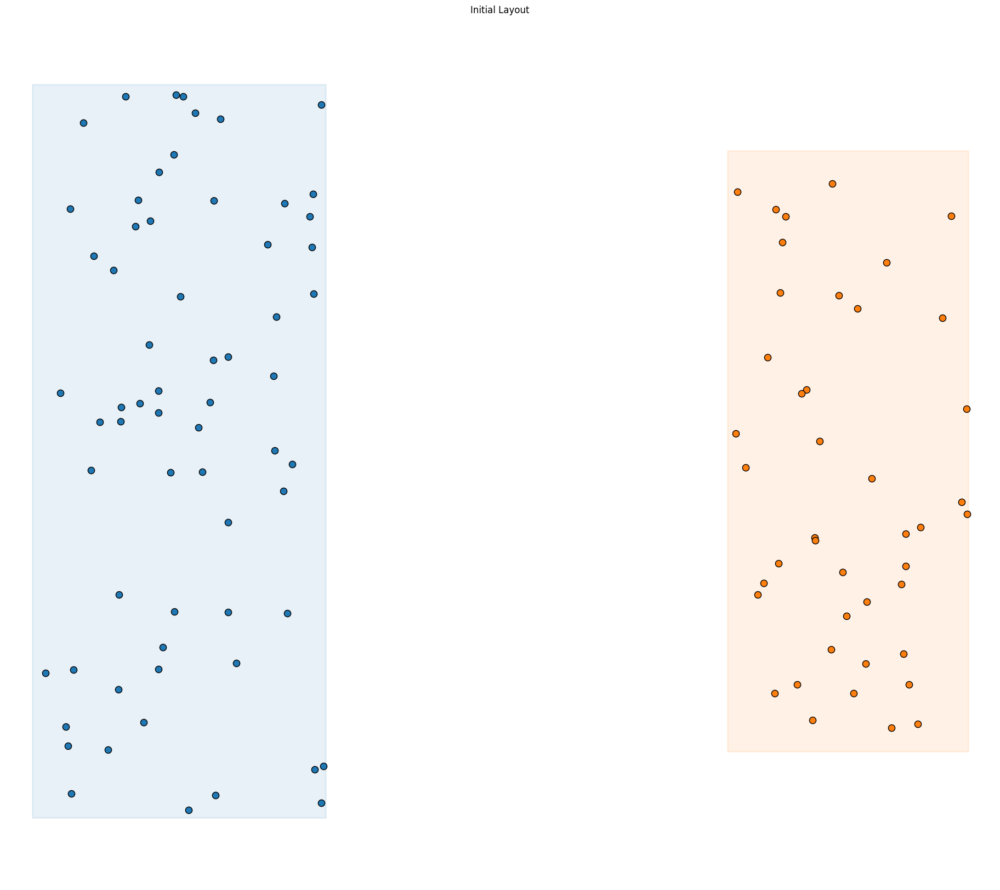

Saved frame 1 to ../Output_subgraphs\subgraph_layout_iter_0001.png


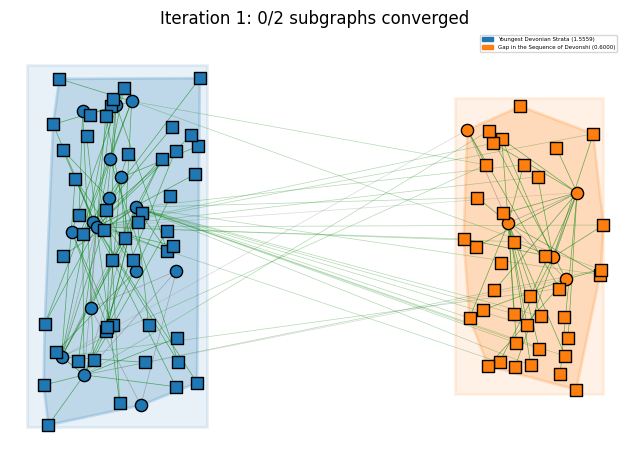

Saved frame 2 to ../Output_subgraphs\subgraph_layout_iter_0002.png


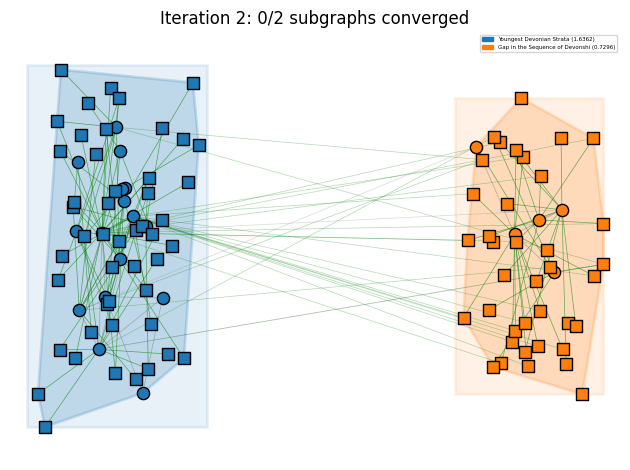

Saved frame 3 to ../Output_subgraphs\subgraph_layout_iter_0003.png


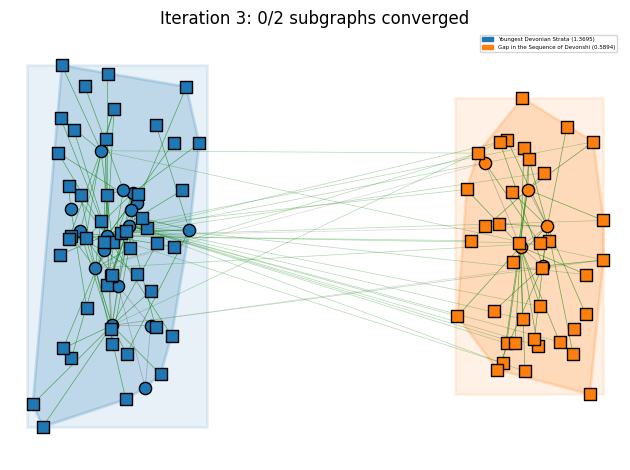

Saved frame 4 to ../Output_subgraphs\subgraph_layout_iter_0004.png


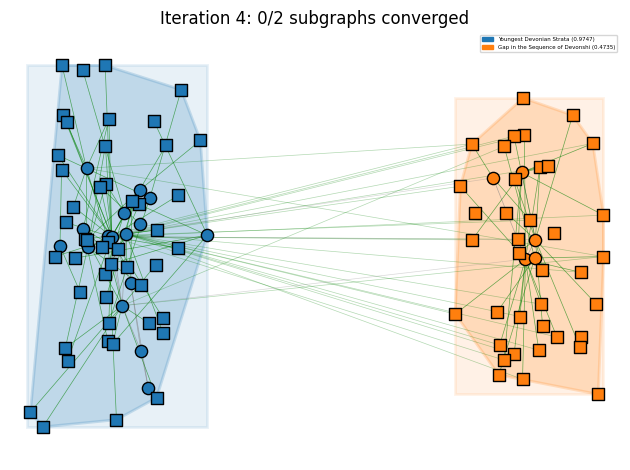

Saved frame 5 to ../Output_subgraphs\subgraph_layout_iter_0005.png


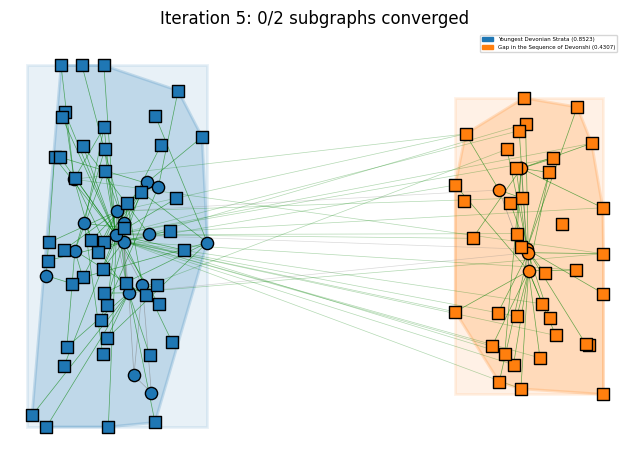

Saved frame 6 to ../Output_subgraphs\subgraph_layout_iter_0006.png


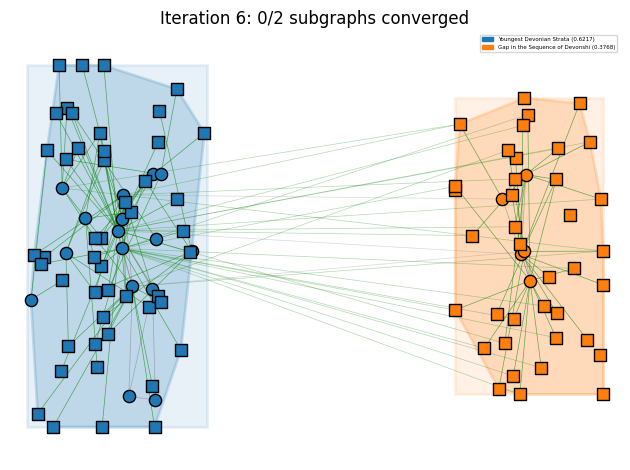

Saved frame 7 to ../Output_subgraphs\subgraph_layout_iter_0007.png


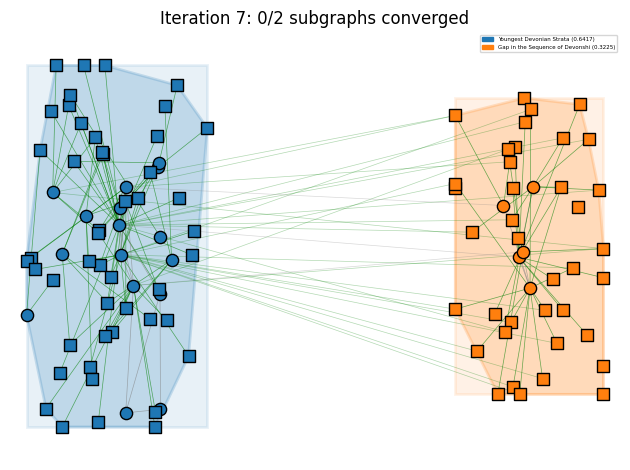

Saved frame 8 to ../Output_subgraphs\subgraph_layout_iter_0008.png


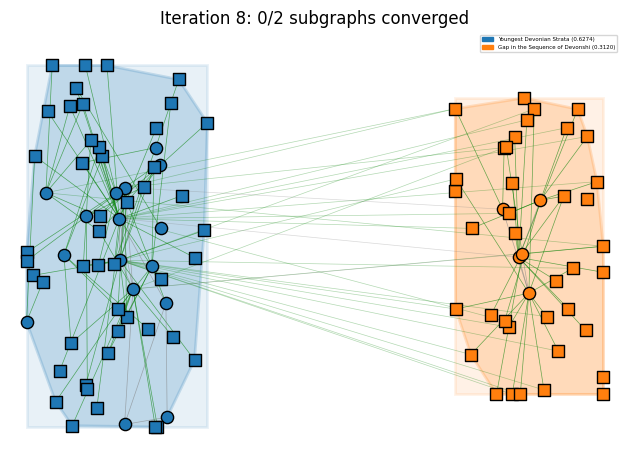

Saved frame 9 to ../Output_subgraphs\subgraph_layout_iter_0009.png


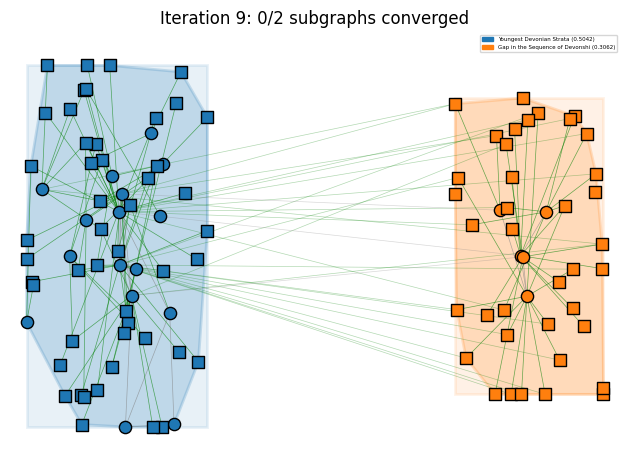

Saved frame 10 to ../Output_subgraphs\subgraph_layout_iter_0010.png


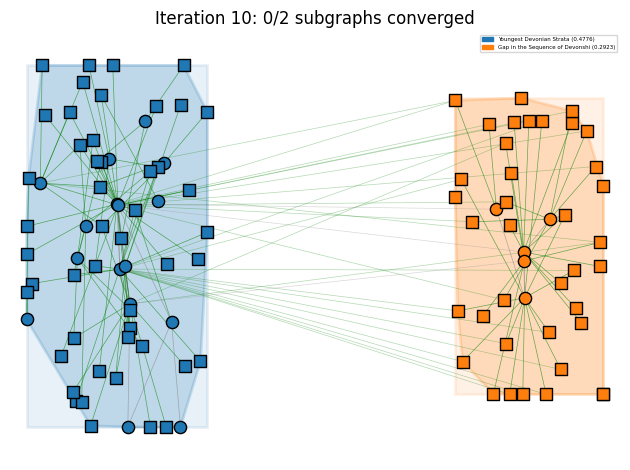

Saved frame 11 to ../Output_subgraphs\subgraph_layout_iter_0011.png


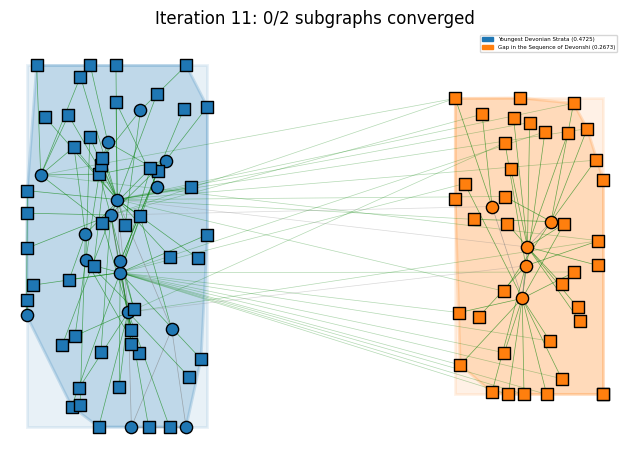

Saved frame 12 to ../Output_subgraphs\subgraph_layout_iter_0012.png


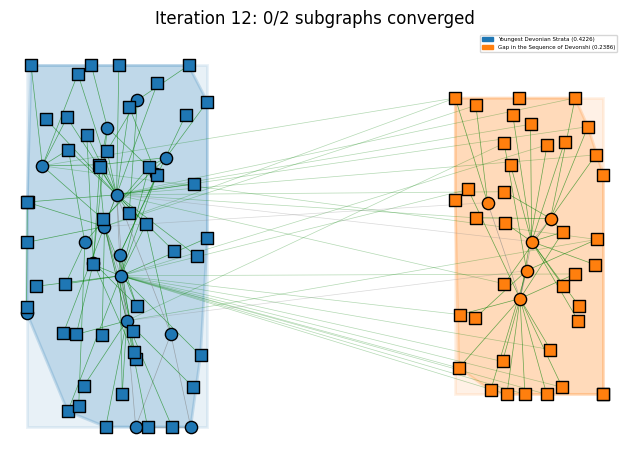

Saved frame 13 to ../Output_subgraphs\subgraph_layout_iter_0013.png


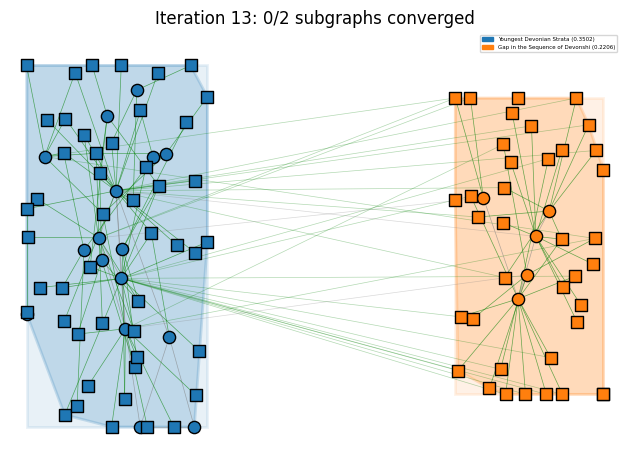

Saved frame 14 to ../Output_subgraphs\subgraph_layout_iter_0014.png


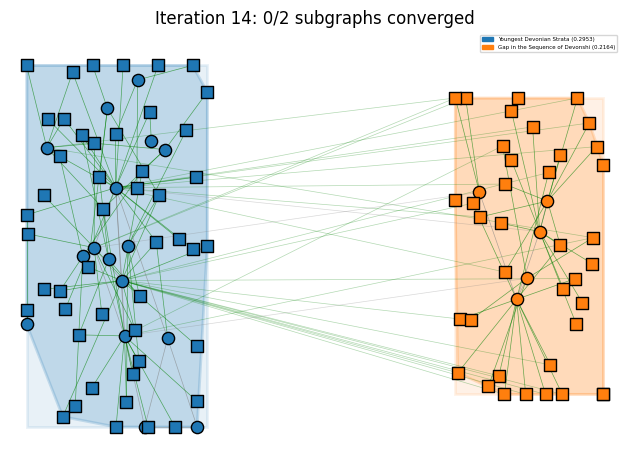

Saved frame 15 to ../Output_subgraphs\subgraph_layout_iter_0015.png


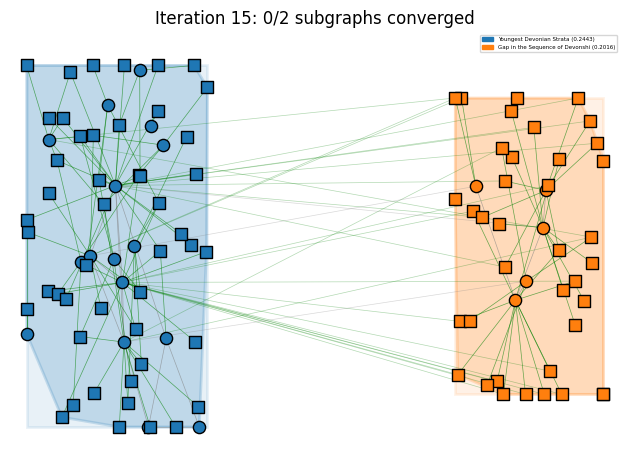

Saved frame 16 to ../Output_subgraphs\subgraph_layout_iter_0016.png


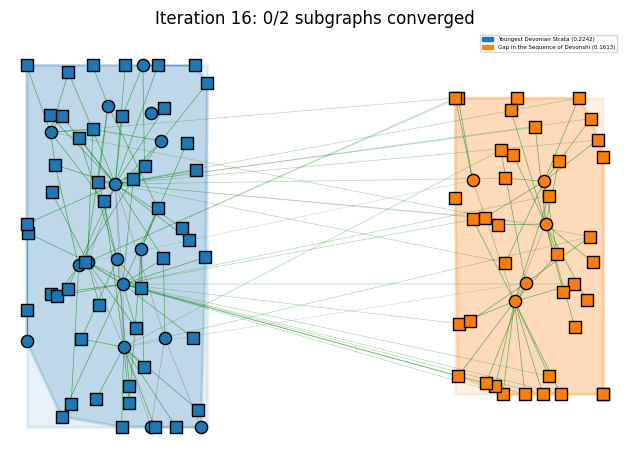

Saved frame 17 to ../Output_subgraphs\subgraph_layout_iter_0017.png


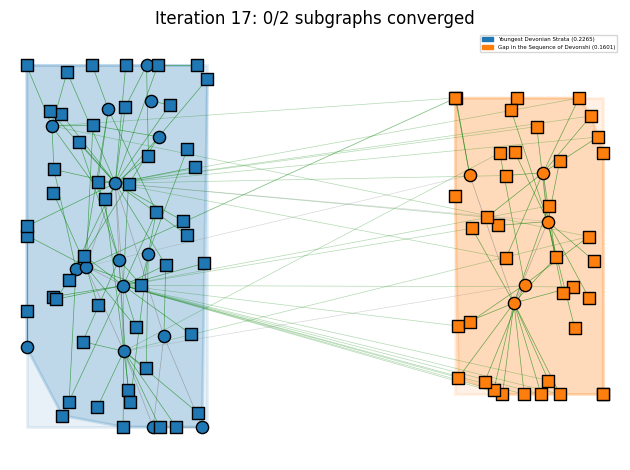

Saved frame 18 to ../Output_subgraphs\subgraph_layout_iter_0018.png


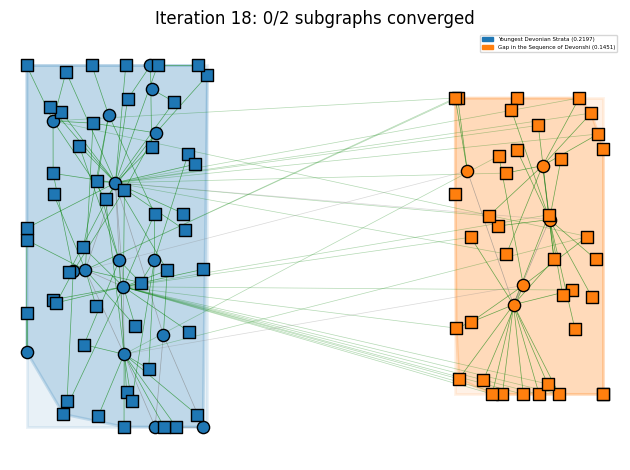

Saved frame 19 to ../Output_subgraphs\subgraph_layout_iter_0019.png


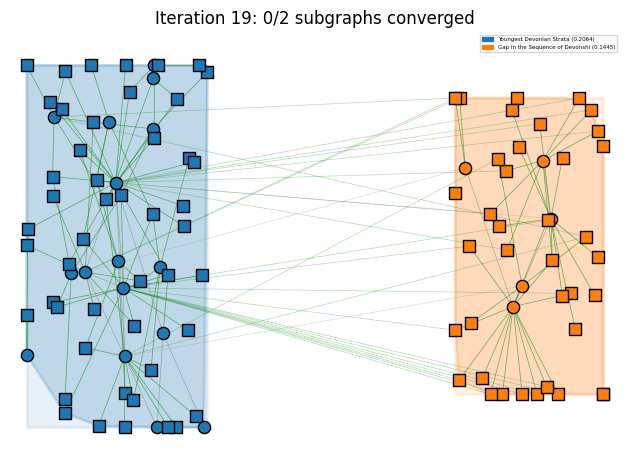

Saved frame 20 to ../Output_subgraphs\subgraph_layout_iter_0020.png


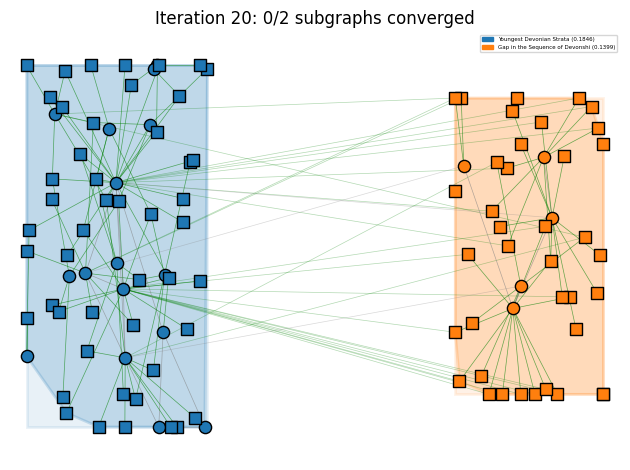

Saved frame 21 to ../Output_subgraphs\subgraph_layout_iter_0021.png


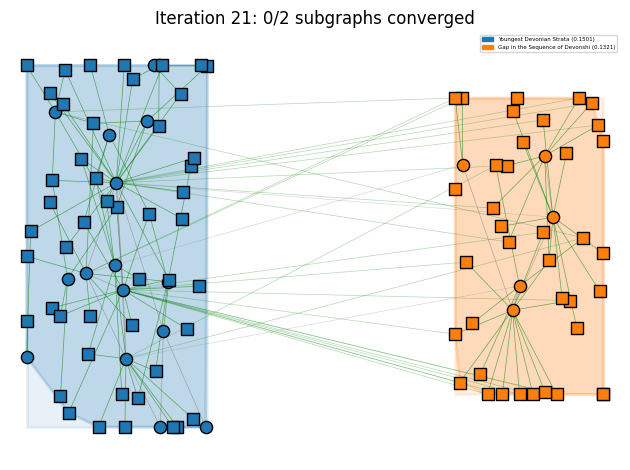

Saved frame 22 to ../Output_subgraphs\subgraph_layout_iter_0022.png


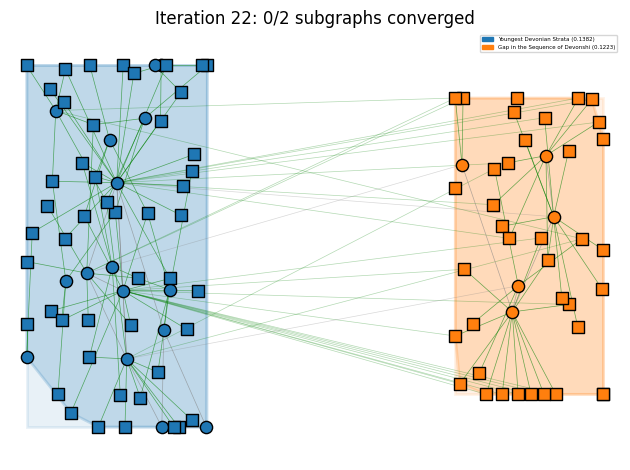

Saved frame 23 to ../Output_subgraphs\subgraph_layout_iter_0023.png


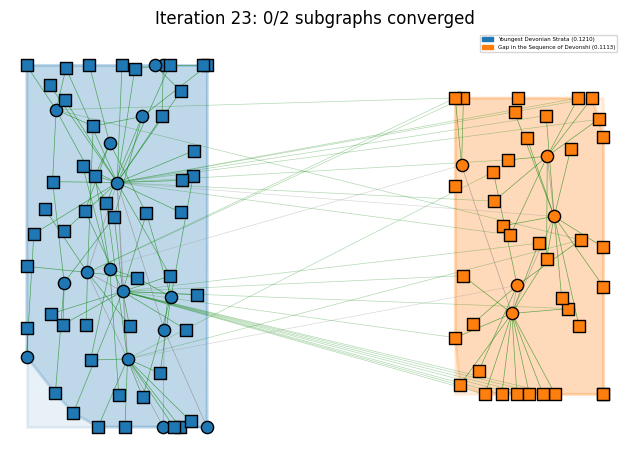

Saved frame 24 to ../Output_subgraphs\subgraph_layout_iter_0024.png


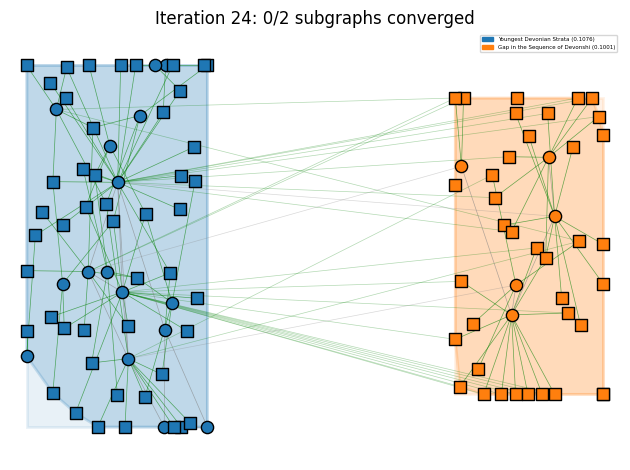

Saved frame 25 to ../Output_subgraphs\subgraph_layout_iter_0025.png


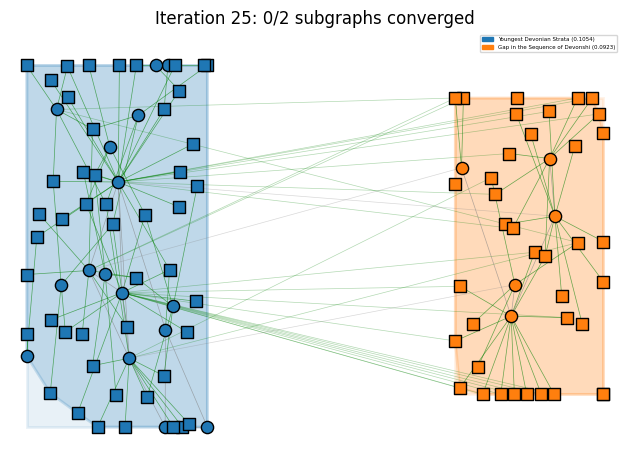

Saved frame 26 to ../Output_subgraphs\subgraph_layout_iter_0026.png


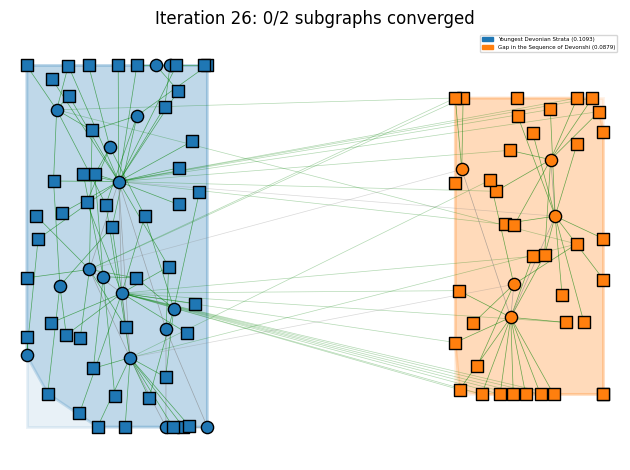

Saved frame 27 to ../Output_subgraphs\subgraph_layout_iter_0027.png


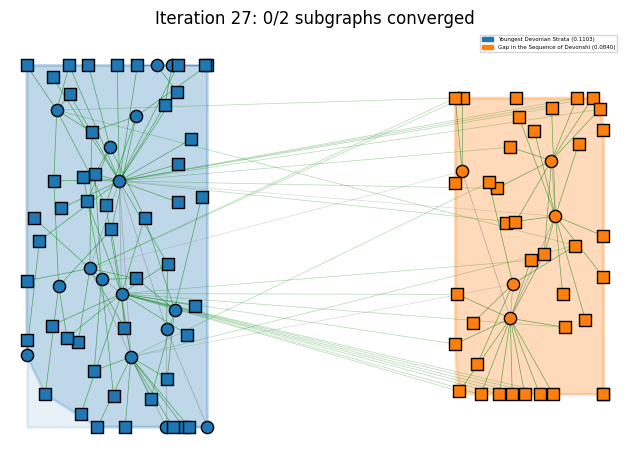

Saved frame 28 to ../Output_subgraphs\subgraph_layout_iter_0028.png


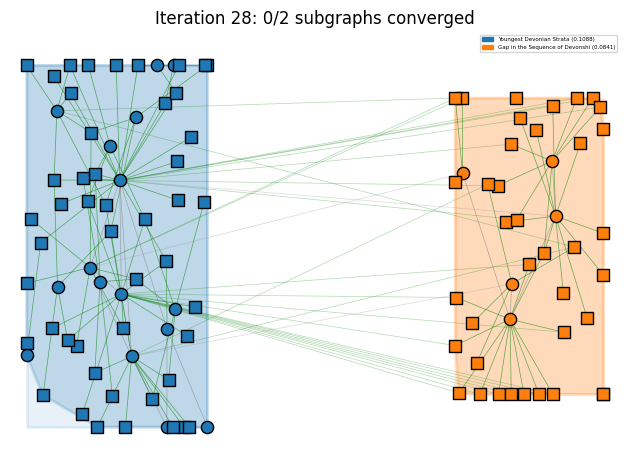

Saved frame 29 to ../Output_subgraphs\subgraph_layout_iter_0029.png


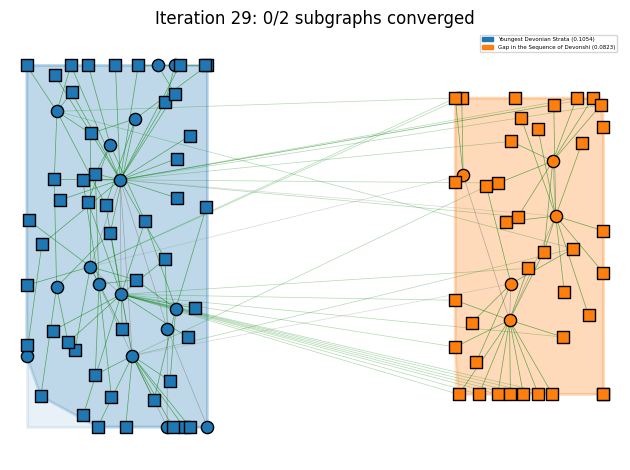

Saved frame 30 to ../Output_subgraphs\subgraph_layout_iter_0030.png


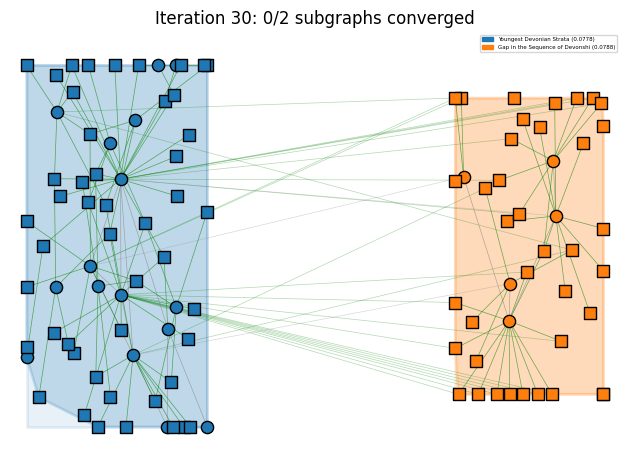

Saved frame 31 to ../Output_subgraphs\subgraph_layout_iter_0031.png


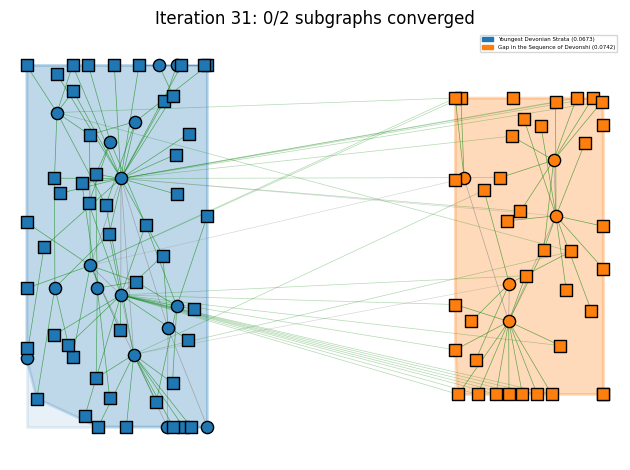

Saved frame 32 to ../Output_subgraphs\subgraph_layout_iter_0032.png


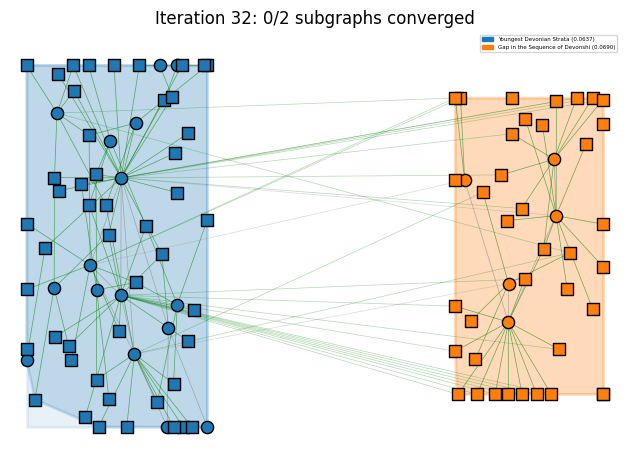

Saved frame 33 to ../Output_subgraphs\subgraph_layout_iter_0033.png


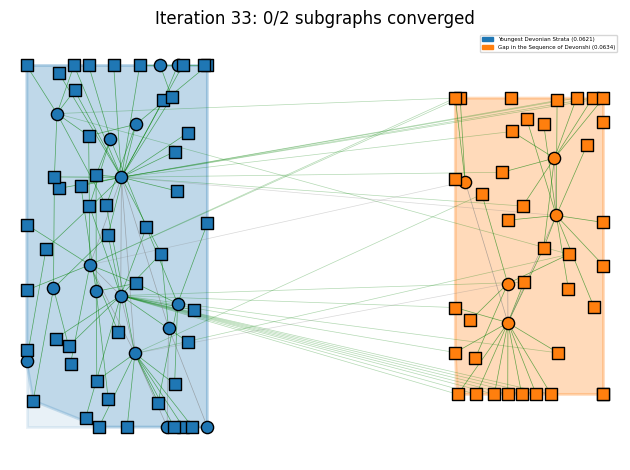

Saved frame 34 to ../Output_subgraphs\subgraph_layout_iter_0034.png


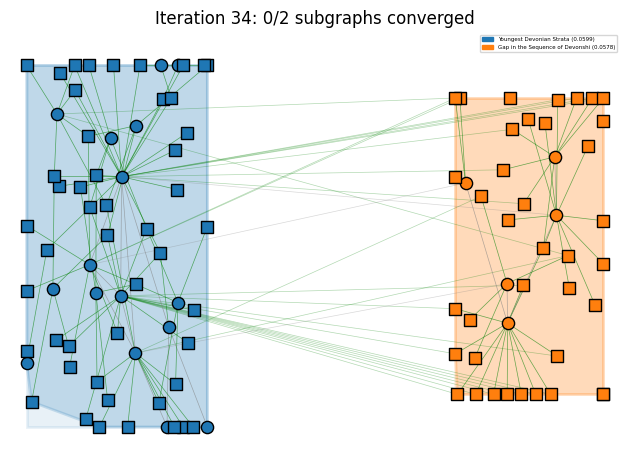

Saved frame 35 to ../Output_subgraphs\subgraph_layout_iter_0035.png


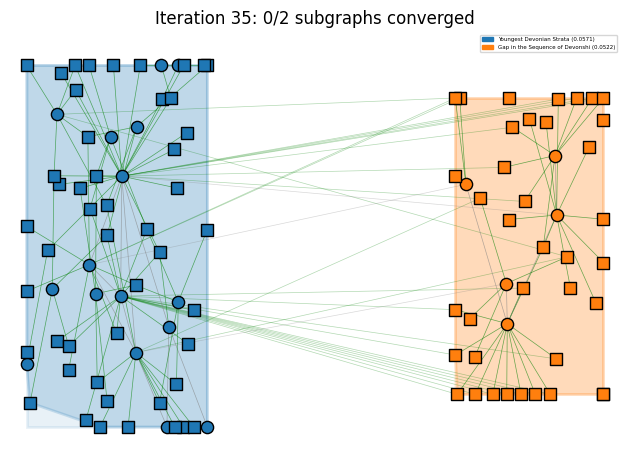

Saved frame 36 to ../Output_subgraphs\subgraph_layout_iter_0036.png


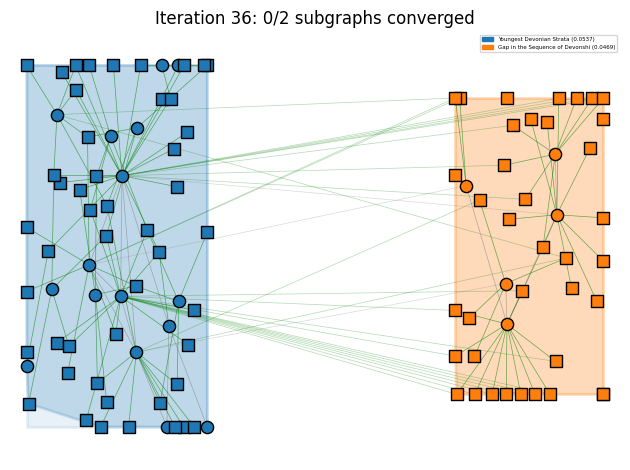

Saved frame 37 to ../Output_subgraphs\subgraph_layout_iter_0037.png


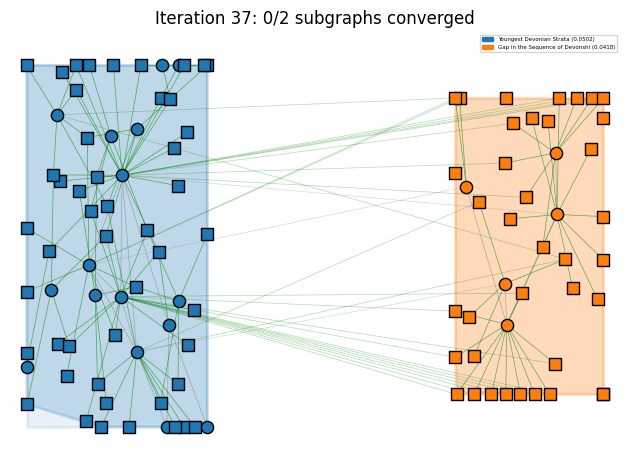

Saved frame 38 to ../Output_subgraphs\subgraph_layout_iter_0038.png


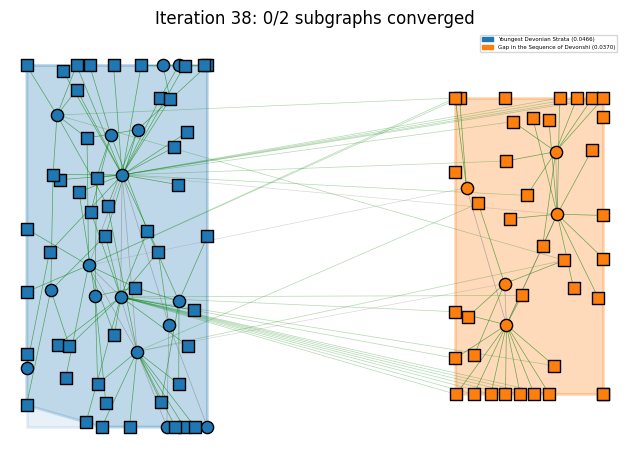

Saved frame 39 to ../Output_subgraphs\subgraph_layout_iter_0039.png


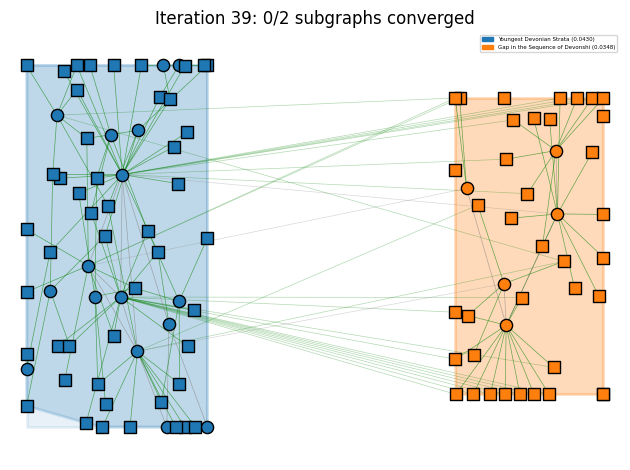

Saved frame 40 to ../Output_subgraphs\subgraph_layout_iter_0040.png


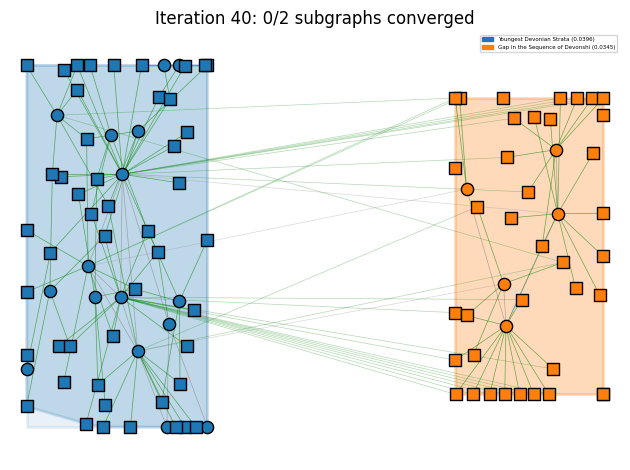

Saved frame 41 to ../Output_subgraphs\subgraph_layout_iter_0041.png


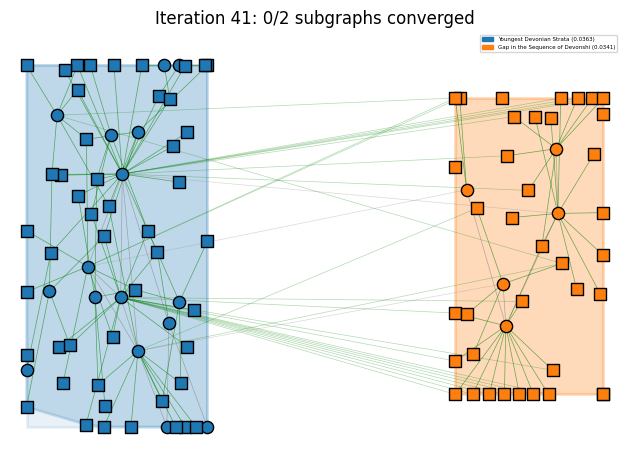

Saved frame 42 to ../Output_subgraphs\subgraph_layout_iter_0042.png


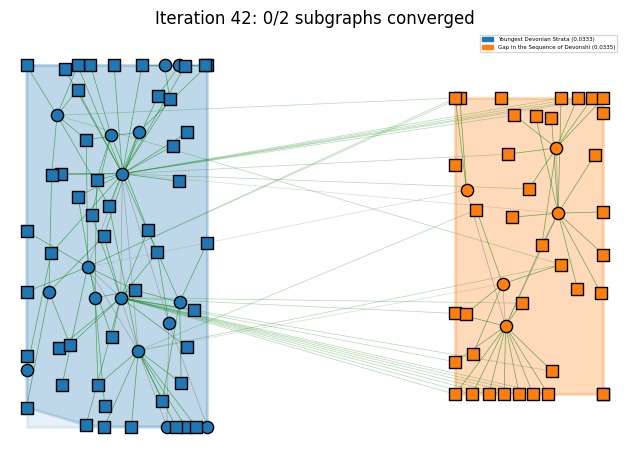

Saved frame 43 to ../Output_subgraphs\subgraph_layout_iter_0043.png


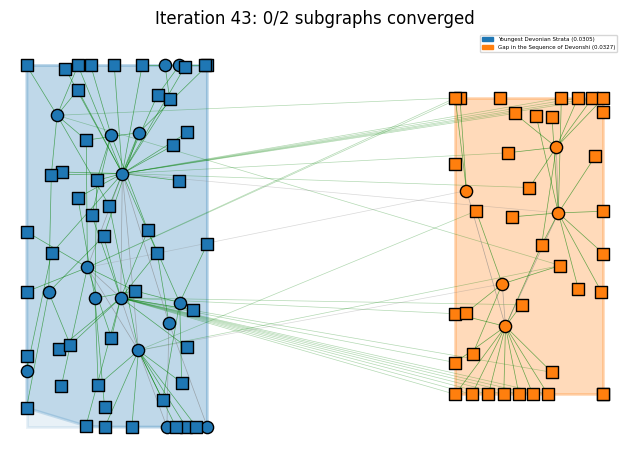

Saved frame 44 to ../Output_subgraphs\subgraph_layout_iter_0044.png


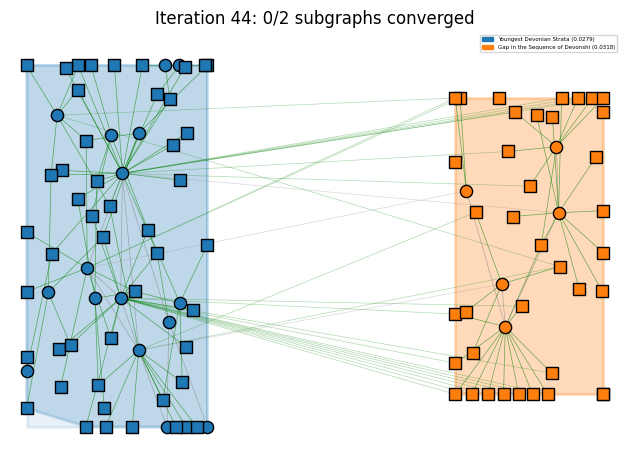

Saved frame 45 to ../Output_subgraphs\subgraph_layout_iter_0045.png


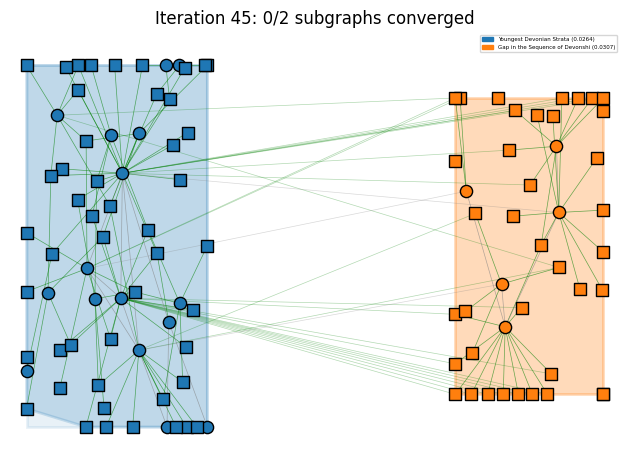

Saved frame 46 to ../Output_subgraphs\subgraph_layout_iter_0046.png


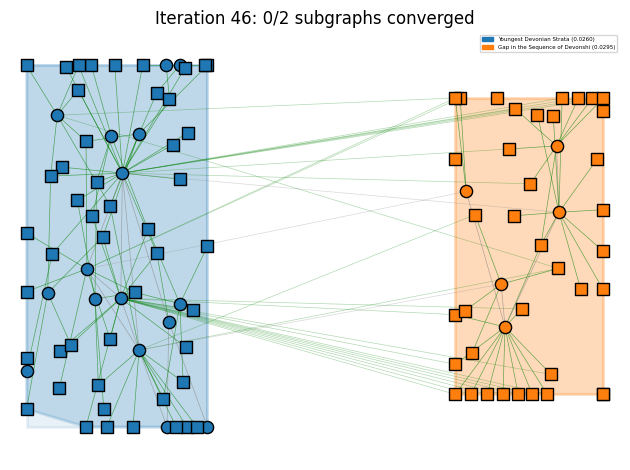

Saved frame 47 to ../Output_subgraphs\subgraph_layout_iter_0047.png


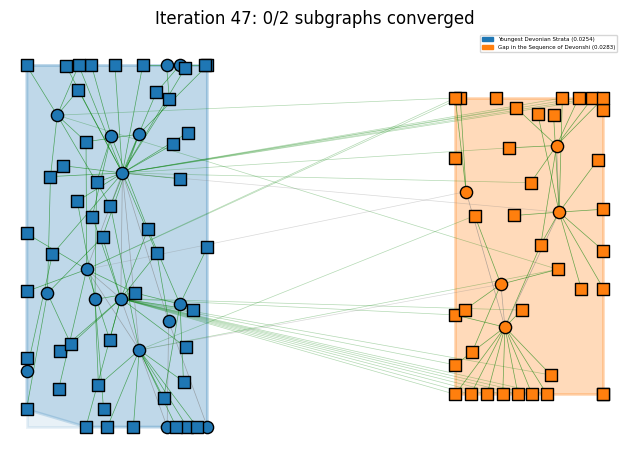

Saved frame 48 to ../Output_subgraphs\subgraph_layout_iter_0048.png


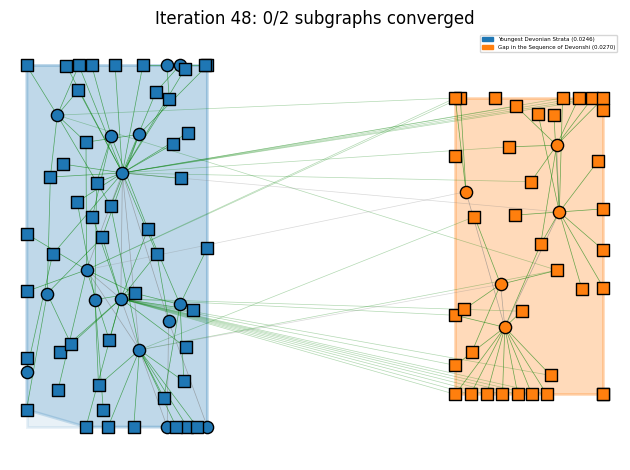

Saved frame 49 to ../Output_subgraphs\subgraph_layout_iter_0049.png


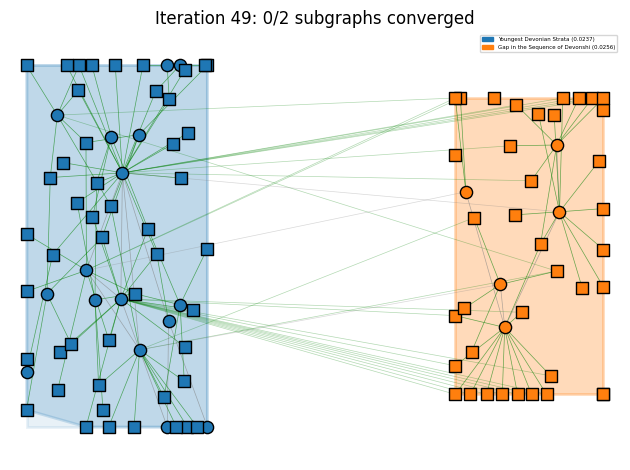

Saved frame 50 to ../Output_subgraphs\subgraph_layout_iter_0050.png


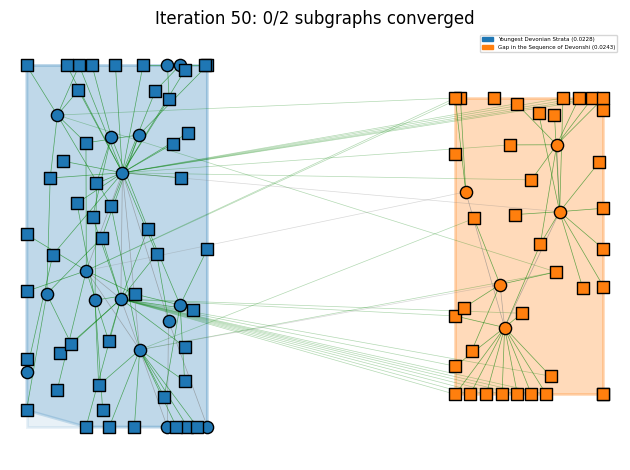

Saved frame 51 to ../Output_subgraphs\subgraph_layout_iter_0051.png


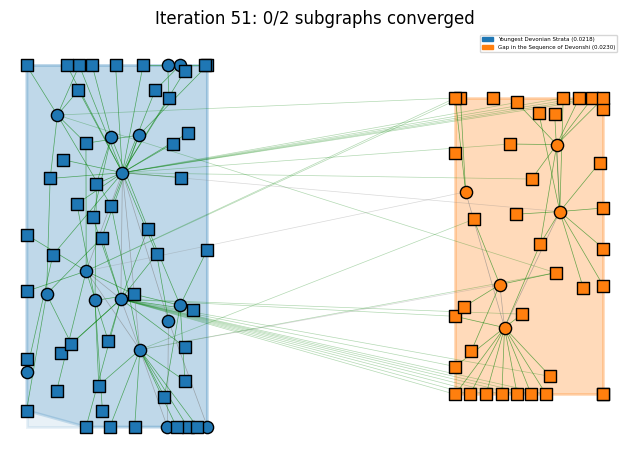

Saved frame 52 to ../Output_subgraphs\subgraph_layout_iter_0052.png


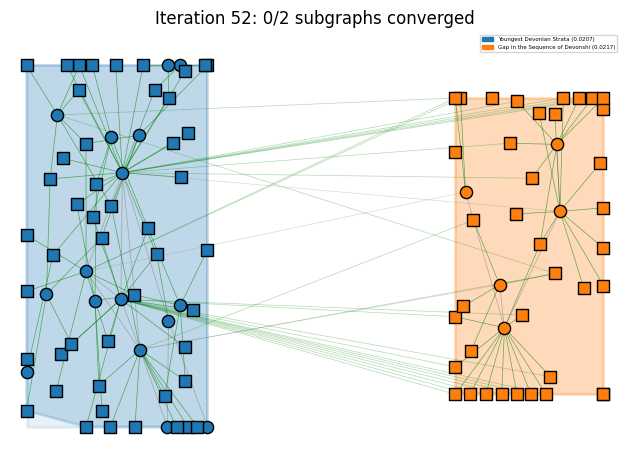

Saved frame 53 to ../Output_subgraphs\subgraph_layout_iter_0053.png


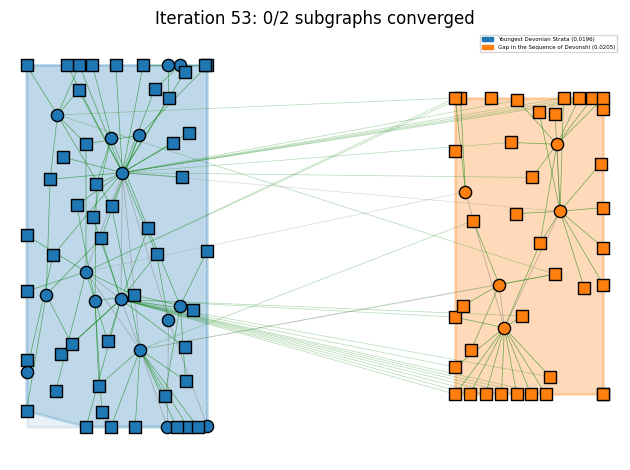

Saved frame 54 to ../Output_subgraphs\subgraph_layout_iter_0054.png


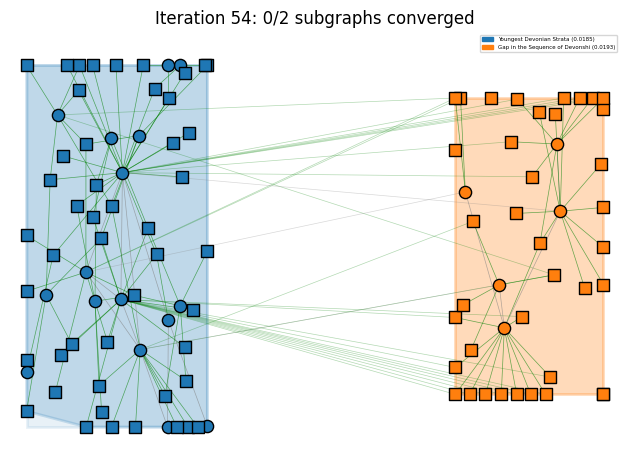

Saved frame 55 to ../Output_subgraphs\subgraph_layout_iter_0055.png


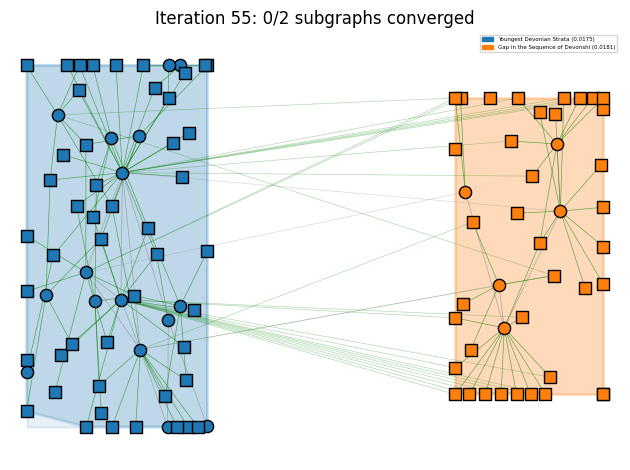

Saved frame 56 to ../Output_subgraphs\subgraph_layout_iter_0056.png


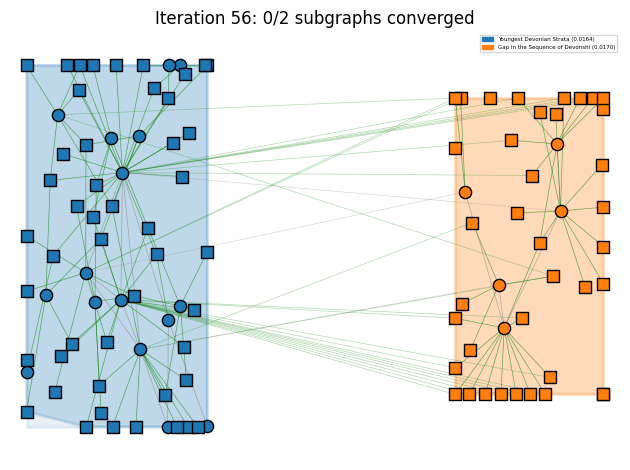

Saved frame 57 to ../Output_subgraphs\subgraph_layout_iter_0057.png


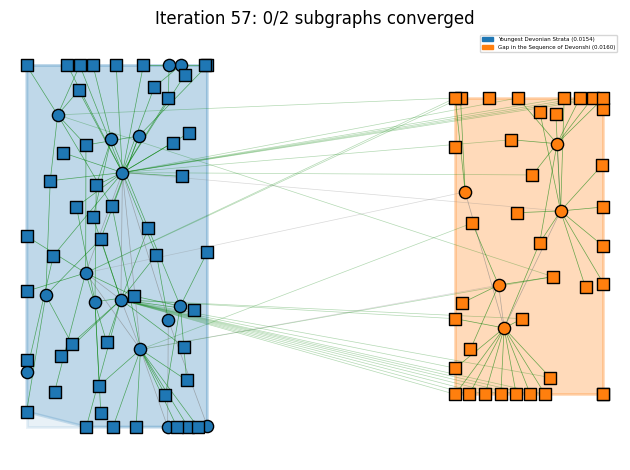

Saved frame 58 to ../Output_subgraphs\subgraph_layout_iter_0058.png


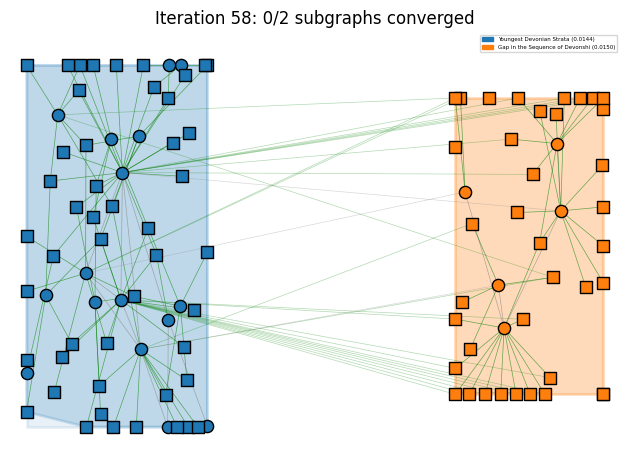

Saved frame 59 to ../Output_subgraphs\subgraph_layout_iter_0059.png


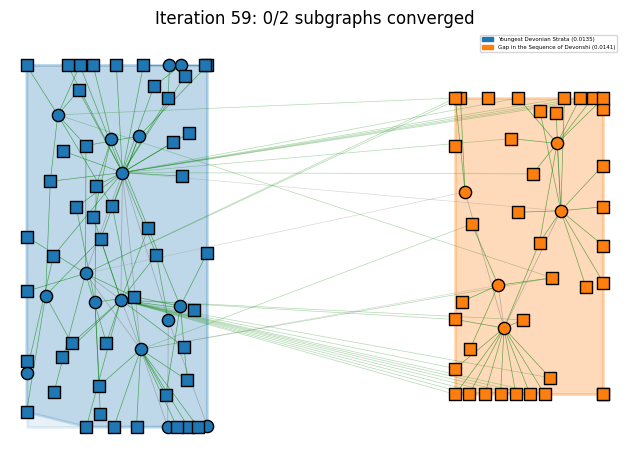

Saved frame 60 to ../Output_subgraphs\subgraph_layout_iter_0060.png


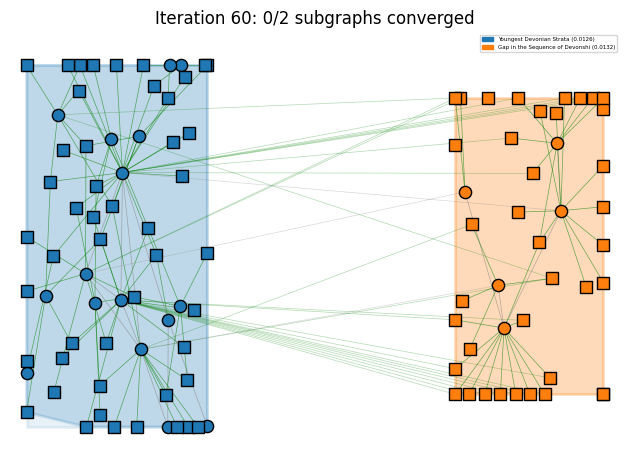

Saved frame 61 to ../Output_subgraphs\subgraph_layout_iter_0061.png


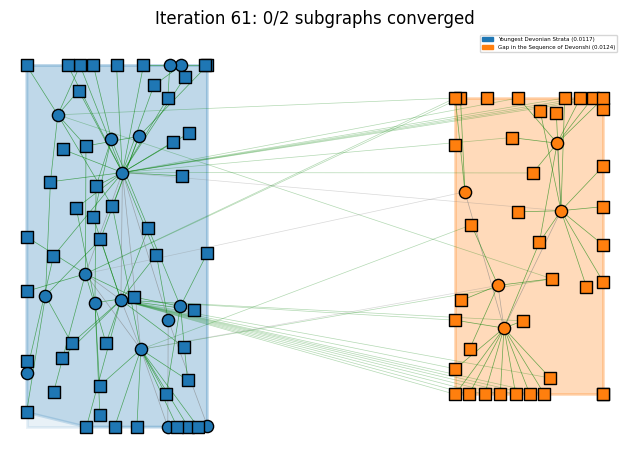

Saved frame 62 to ../Output_subgraphs\subgraph_layout_iter_0062.png


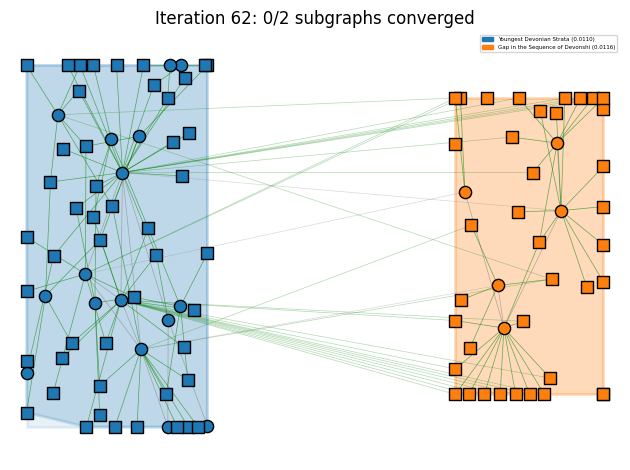

Saved frame 63 to ../Output_subgraphs\subgraph_layout_iter_0063.png


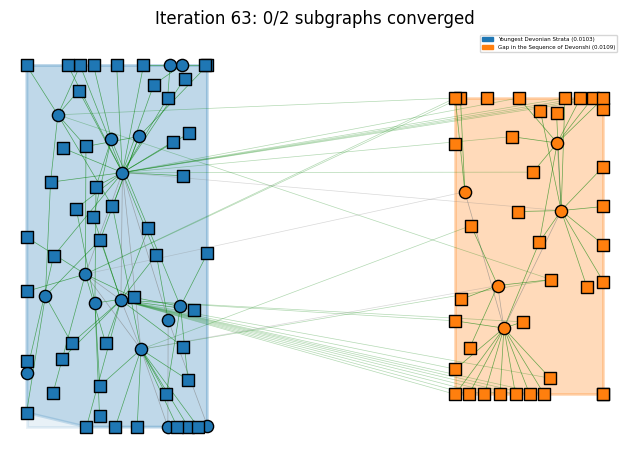

Saved frame 64 to ../Output_subgraphs\subgraph_layout_iter_0064.png


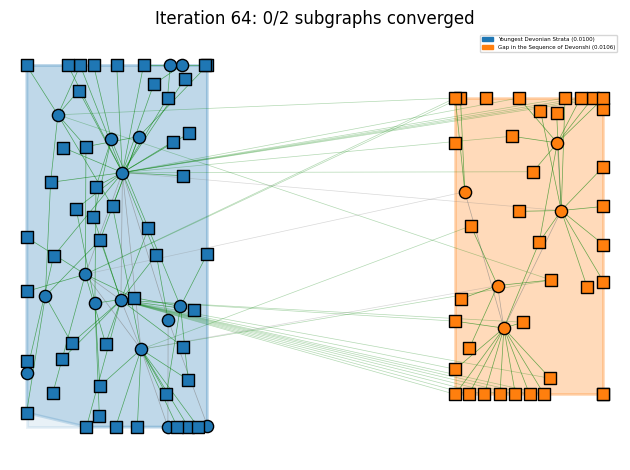

Saved frame 65 to ../Output_subgraphs\subgraph_layout_iter_0065.png


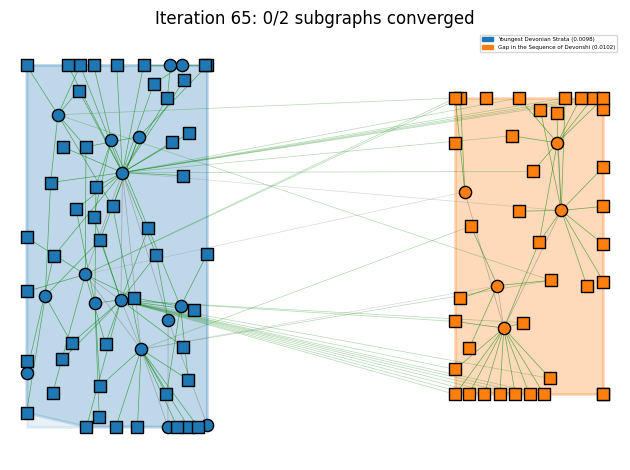

Saved frame 66 to ../Output_subgraphs\subgraph_layout_iter_0066.png


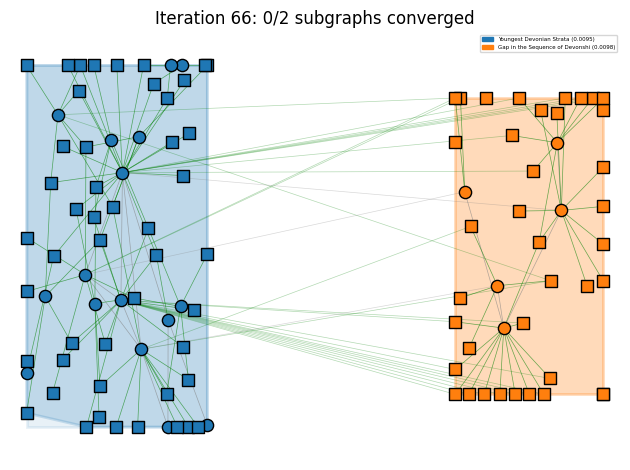

Saved frame 67 to ../Output_subgraphs\subgraph_layout_iter_0067.png


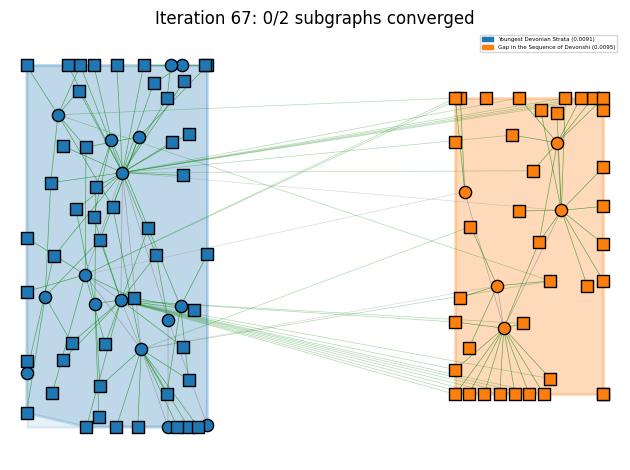

Saved frame 68 to ../Output_subgraphs\subgraph_layout_iter_0068.png


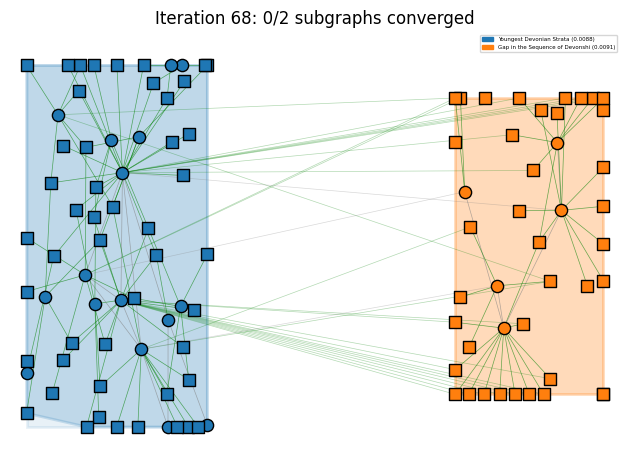

Saved frame 69 to ../Output_subgraphs\subgraph_layout_iter_0069.png


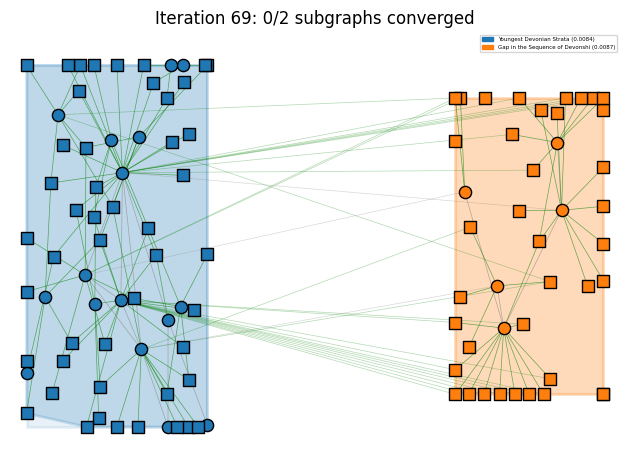

Saved frame 70 to ../Output_subgraphs\subgraph_layout_iter_0070.png


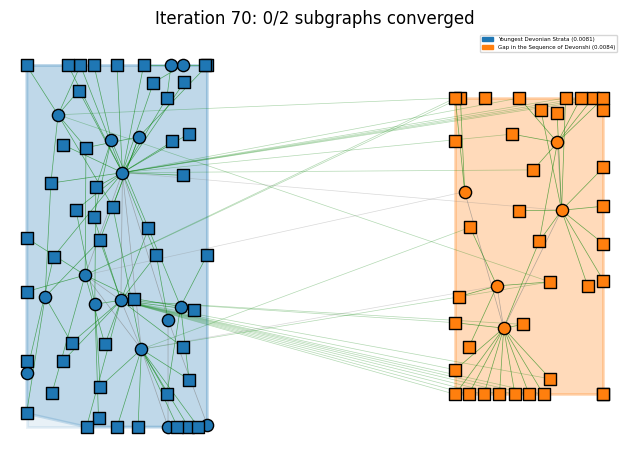

Saved frame 71 to ../Output_subgraphs\subgraph_layout_iter_0071.png


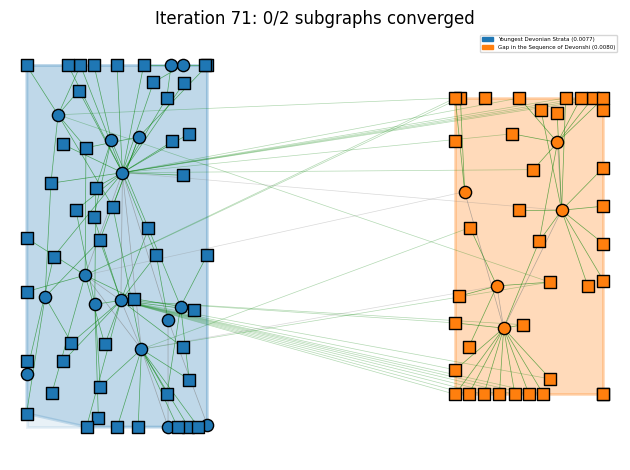

Saved frame 72 to ../Output_subgraphs\subgraph_layout_iter_0072.png


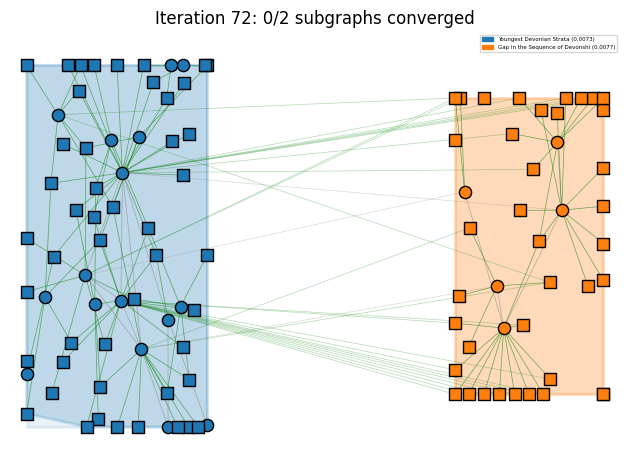

Saved frame 73 to ../Output_subgraphs\subgraph_layout_iter_0073.png


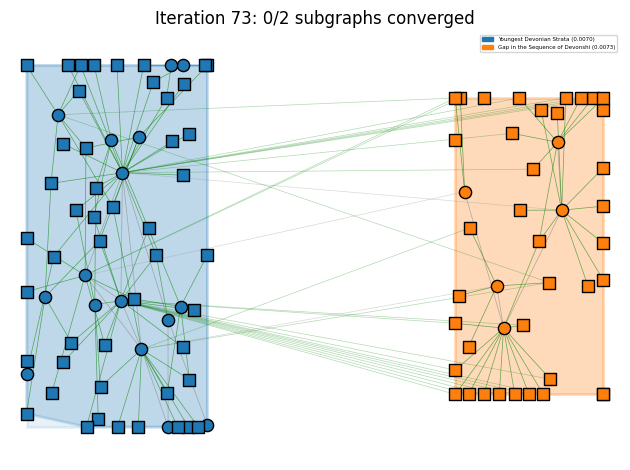

Saved frame 74 to ../Output_subgraphs\subgraph_layout_iter_0074.png


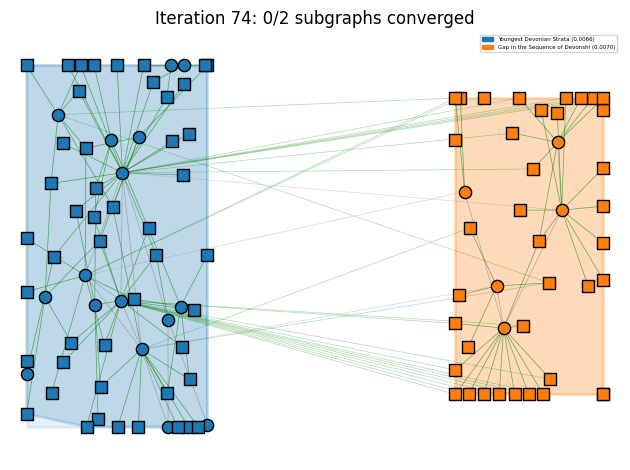

Saved frame 75 to ../Output_subgraphs\subgraph_layout_iter_0075.png


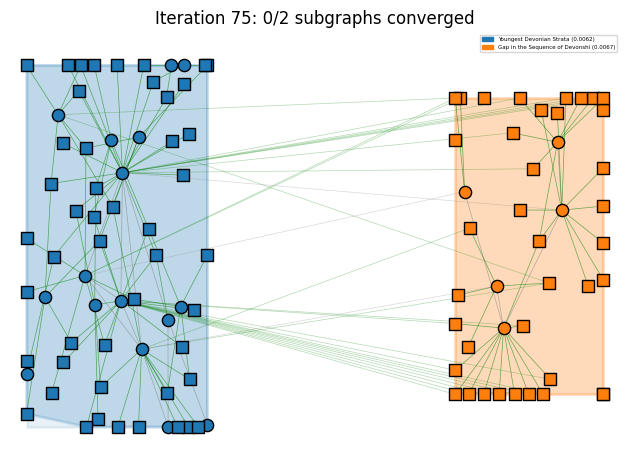

Saved frame 76 to ../Output_subgraphs\subgraph_layout_iter_0076.png


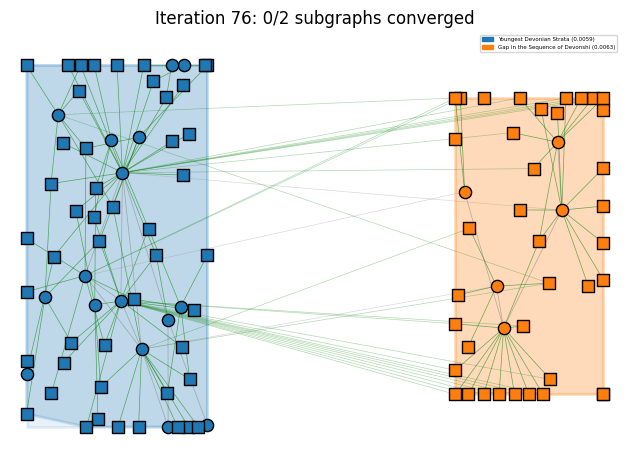

Saved frame 77 to ../Output_subgraphs\subgraph_layout_iter_0077.png


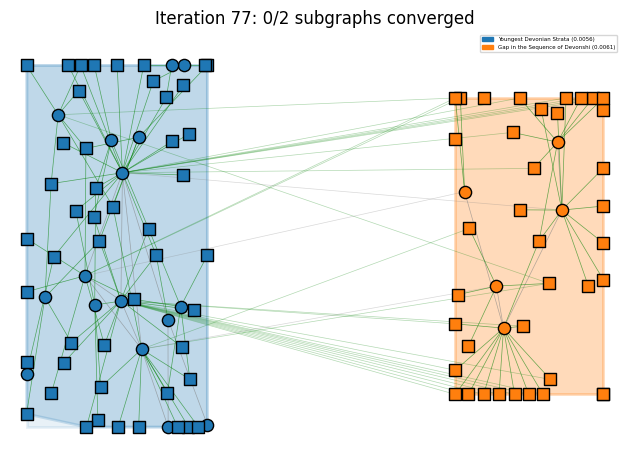

Saved frame 78 to ../Output_subgraphs\subgraph_layout_iter_0078.png


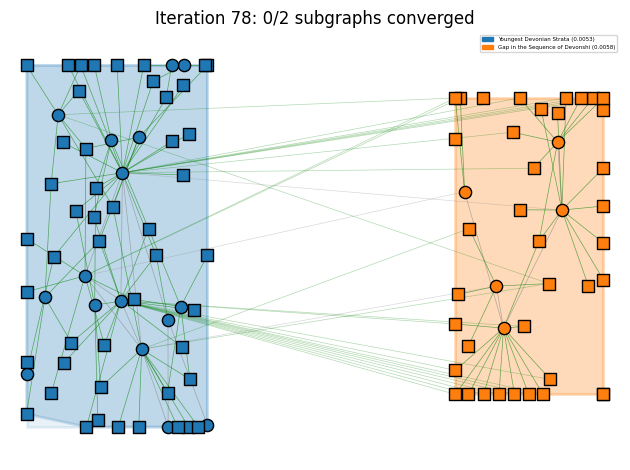

Saved frame 79 to ../Output_subgraphs\subgraph_layout_iter_0079.png


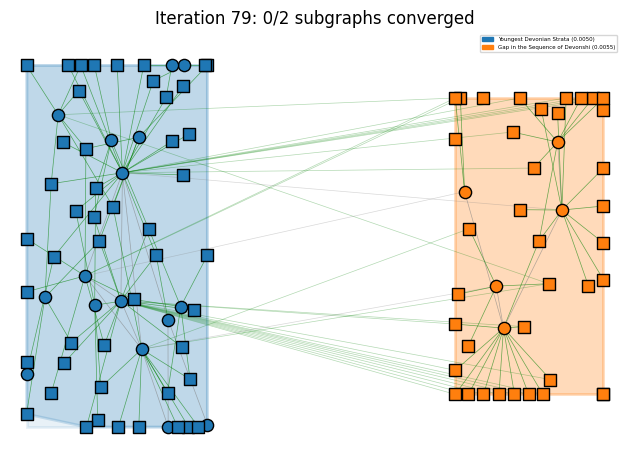

Saved frame 80 to ../Output_subgraphs\subgraph_layout_iter_0080.png


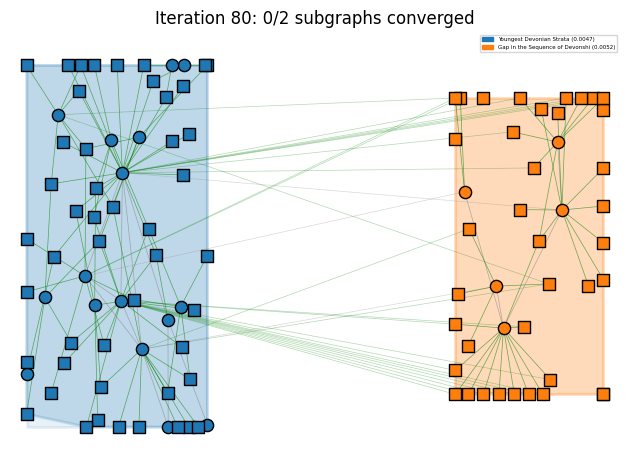

Saved frame 81 to ../Output_subgraphs\subgraph_layout_iter_0081.png


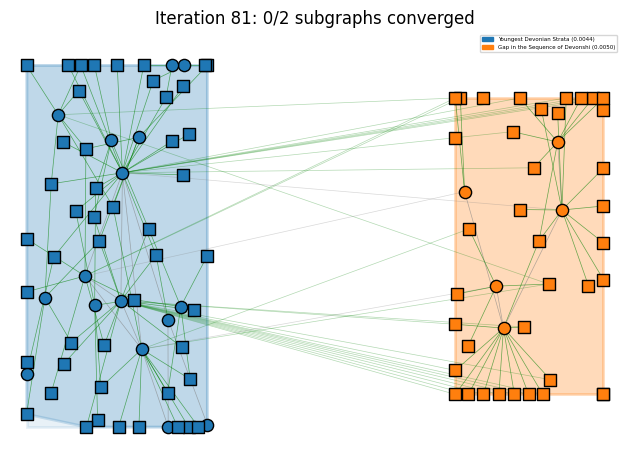

Saved frame 82 to ../Output_subgraphs\subgraph_layout_iter_0082.png


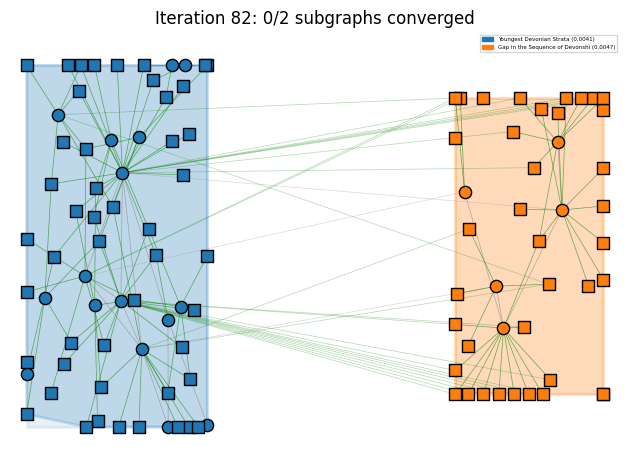

Saved frame 83 to ../Output_subgraphs\subgraph_layout_iter_0083.png


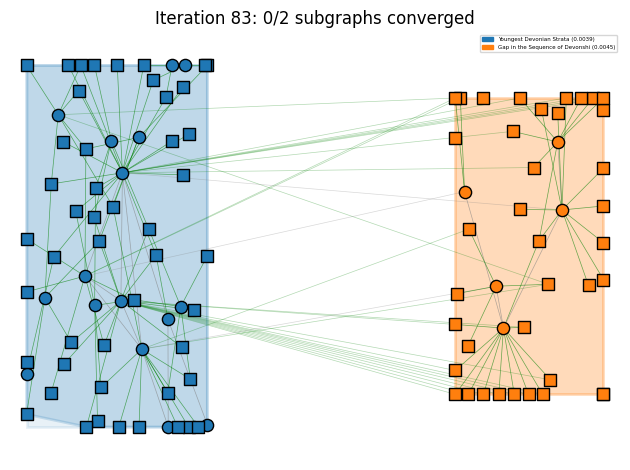

Saved frame 84 to ../Output_subgraphs\subgraph_layout_iter_0084.png


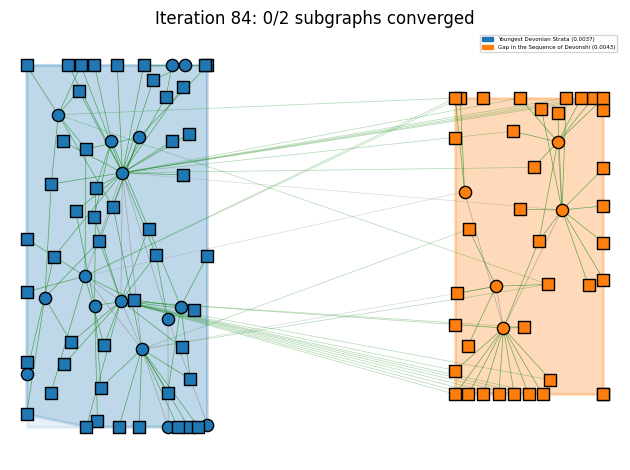

Saved frame 85 to ../Output_subgraphs\subgraph_layout_iter_0085.png


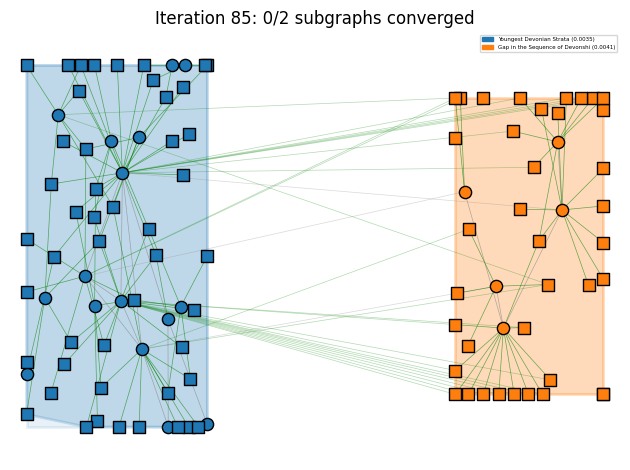

Saved frame 86 to ../Output_subgraphs\subgraph_layout_iter_0086.png


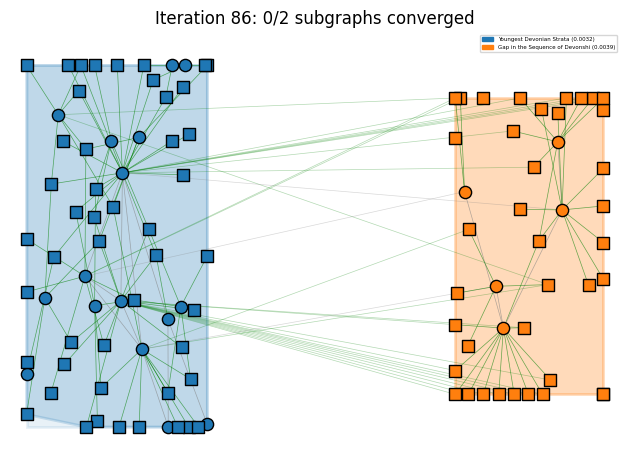

Saved frame 87 to ../Output_subgraphs\subgraph_layout_iter_0087.png


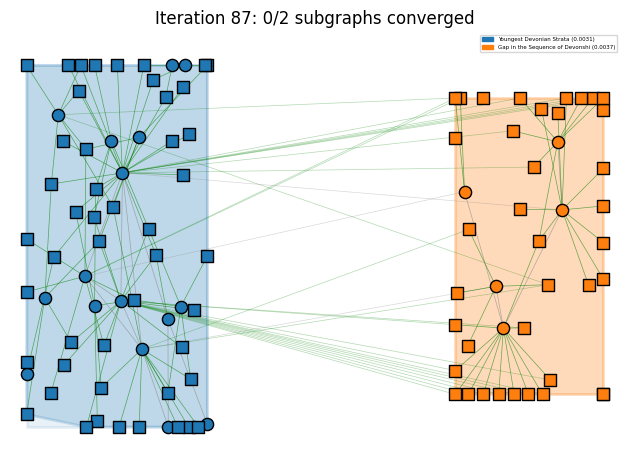

Saved frame 88 to ../Output_subgraphs\subgraph_layout_iter_0088.png


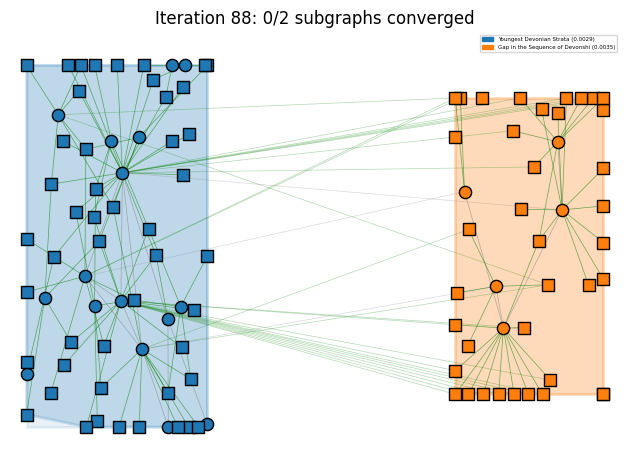

Saved frame 89 to ../Output_subgraphs\subgraph_layout_iter_0089.png


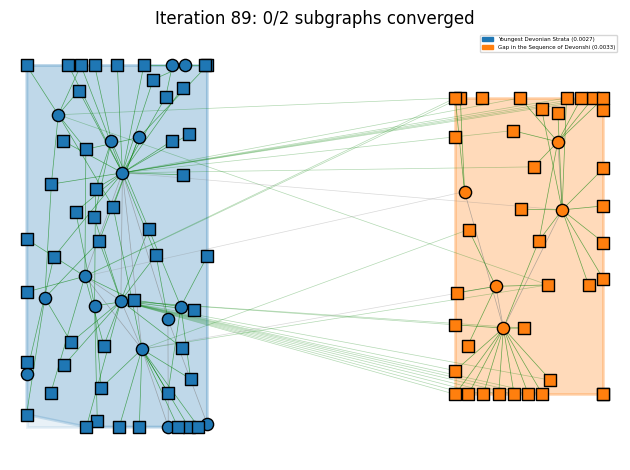

Saved frame 90 to ../Output_subgraphs\subgraph_layout_iter_0090.png


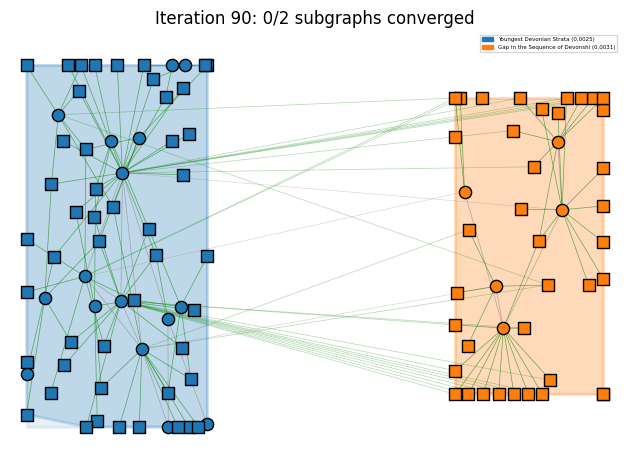

Saved frame 91 to ../Output_subgraphs\subgraph_layout_iter_0091.png


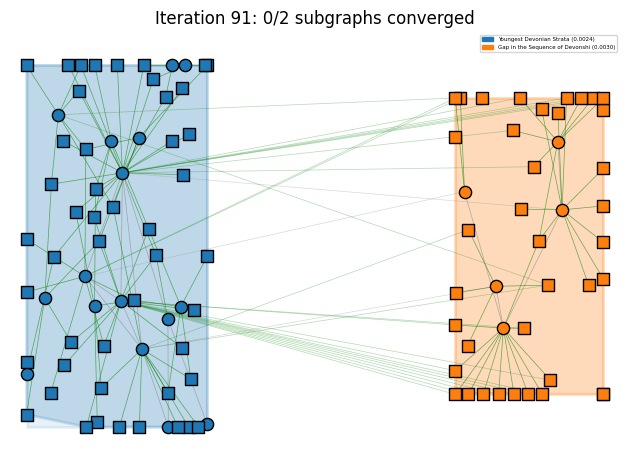

Saved frame 92 to ../Output_subgraphs\subgraph_layout_iter_0092.png


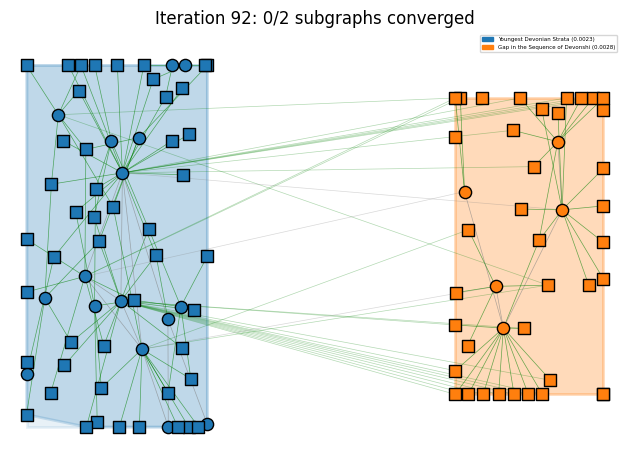

Saved frame 93 to ../Output_subgraphs\subgraph_layout_iter_0093.png


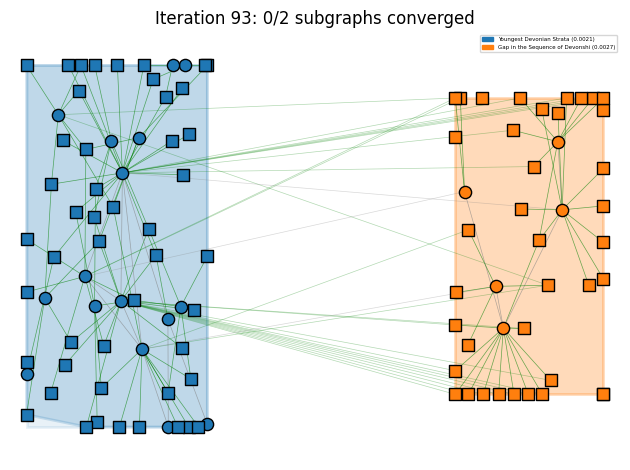

Saved frame 94 to ../Output_subgraphs\subgraph_layout_iter_0094.png


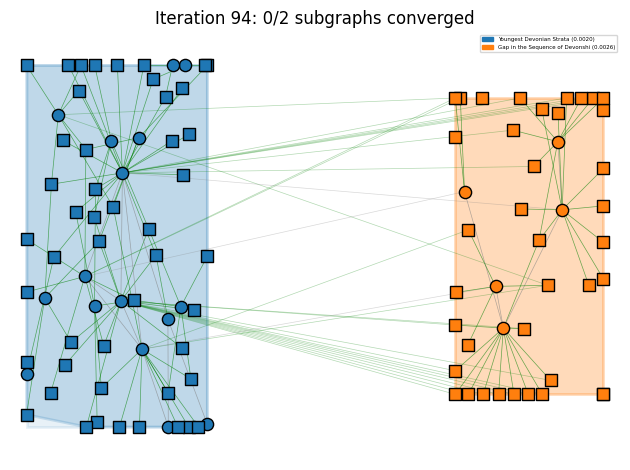

Saved frame 95 to ../Output_subgraphs\subgraph_layout_iter_0095.png


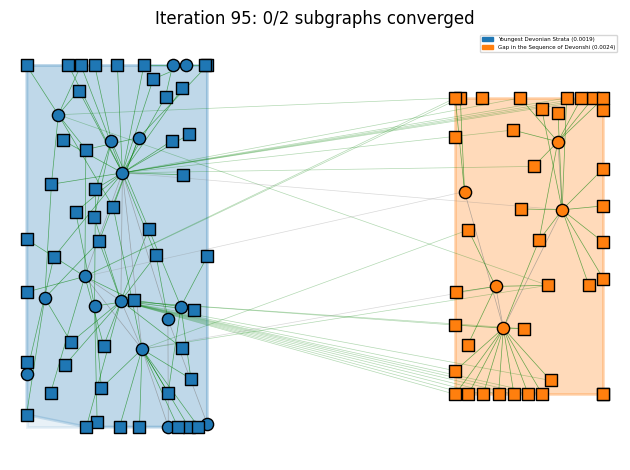

Saved frame 96 to ../Output_subgraphs\subgraph_layout_iter_0096.png


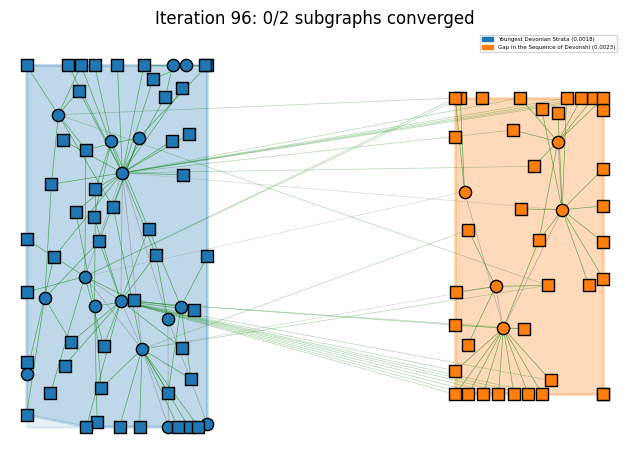

Saved frame 97 to ../Output_subgraphs\subgraph_layout_iter_0097.png


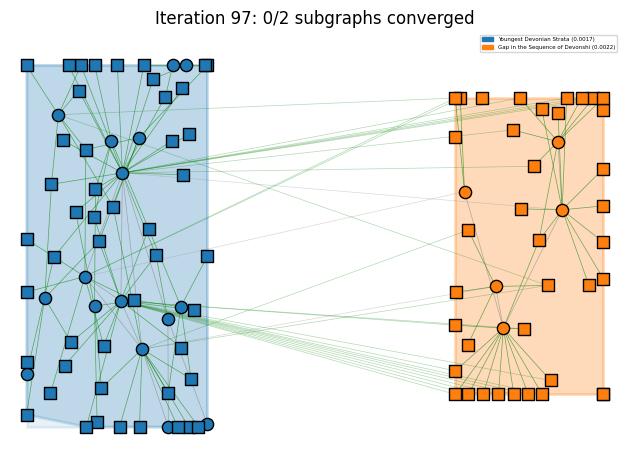

Saved frame 98 to ../Output_subgraphs\subgraph_layout_iter_0098.png


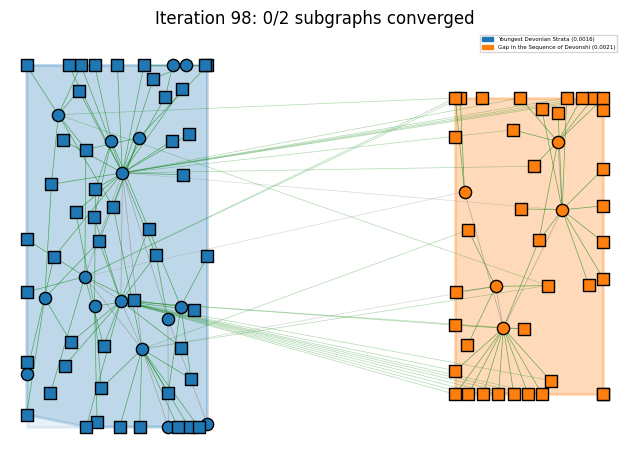

Saved frame 99 to ../Output_subgraphs\subgraph_layout_iter_0099.png


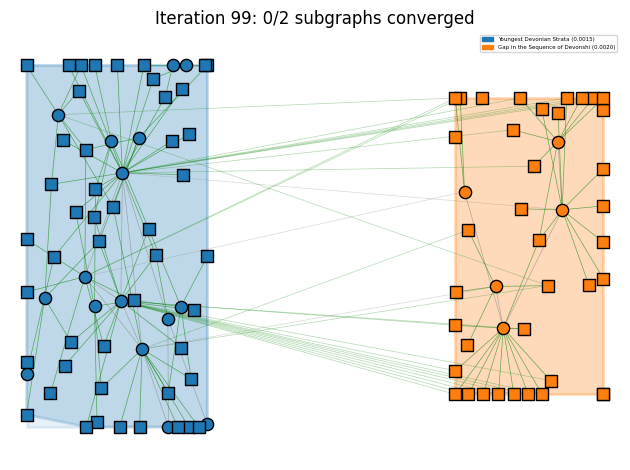

Saved frame 100 to ../Output_subgraphs\subgraph_layout_iter_0100.png


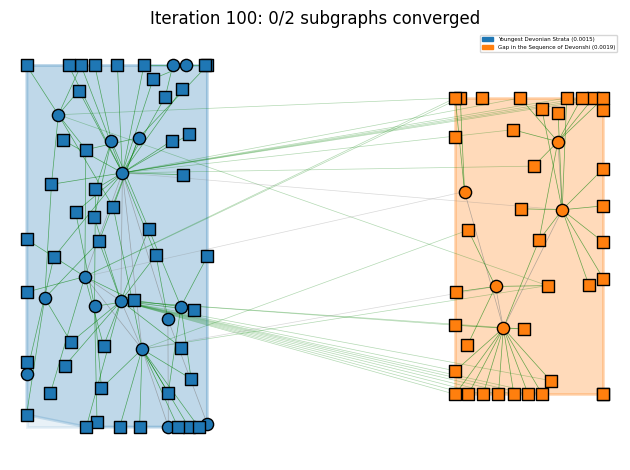

Saved frame 101 to ../Output_subgraphs\subgraph_layout_iter_0101.png


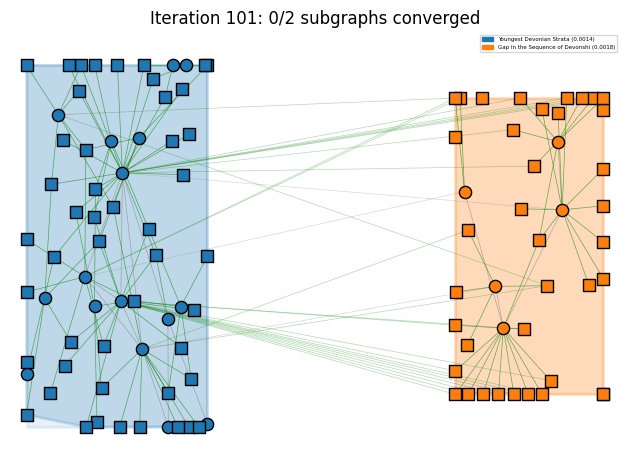

Saved frame 102 to ../Output_subgraphs\subgraph_layout_iter_0102.png


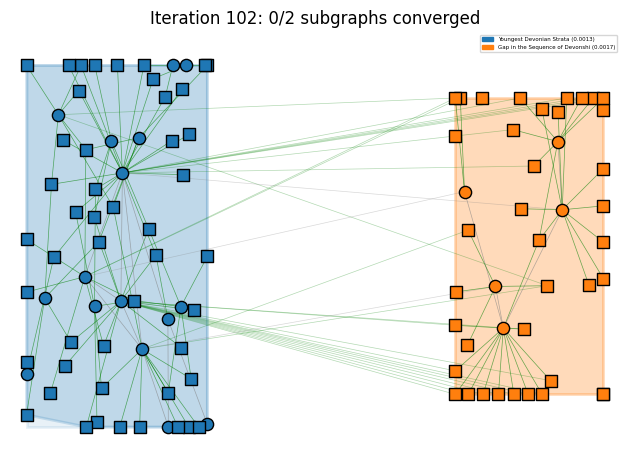

Saved frame 103 to ../Output_subgraphs\subgraph_layout_iter_0103.png


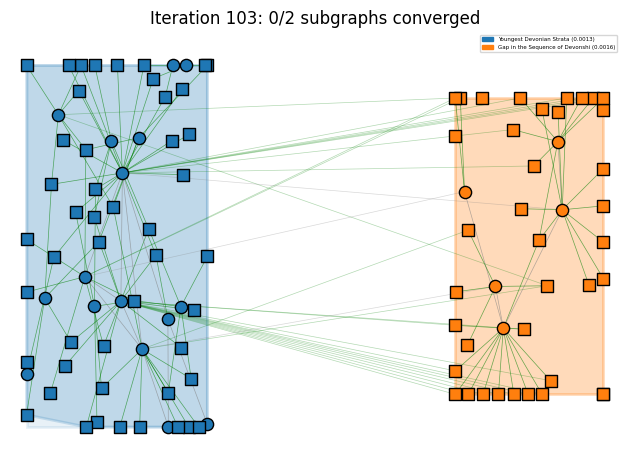

Saved frame 104 to ../Output_subgraphs\subgraph_layout_iter_0104.png


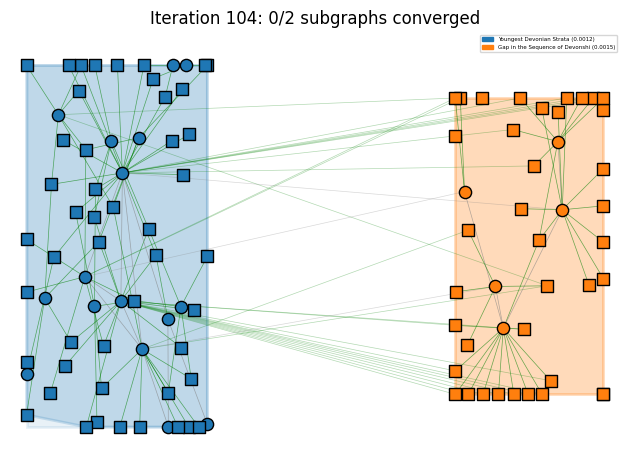

Saved frame 105 to ../Output_subgraphs\subgraph_layout_iter_0105.png


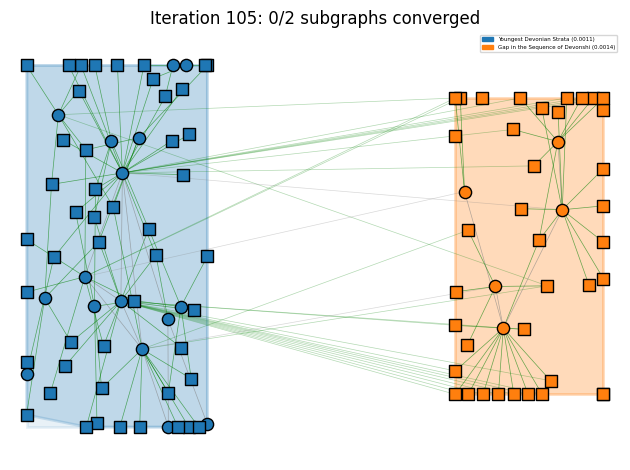

Saved frame 106 to ../Output_subgraphs\subgraph_layout_iter_0106.png


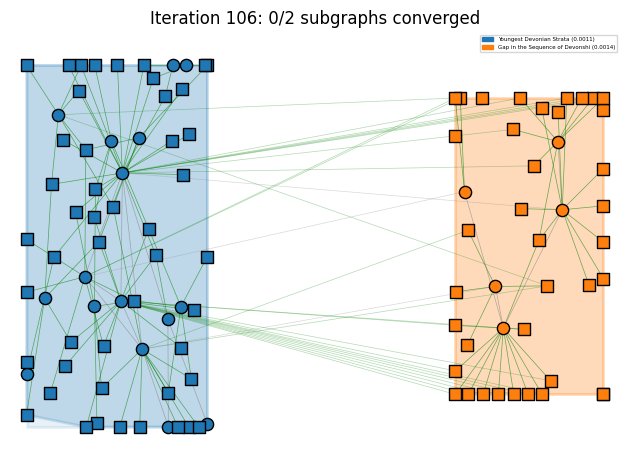

Saved frame 107 to ../Output_subgraphs\subgraph_layout_iter_0107.png


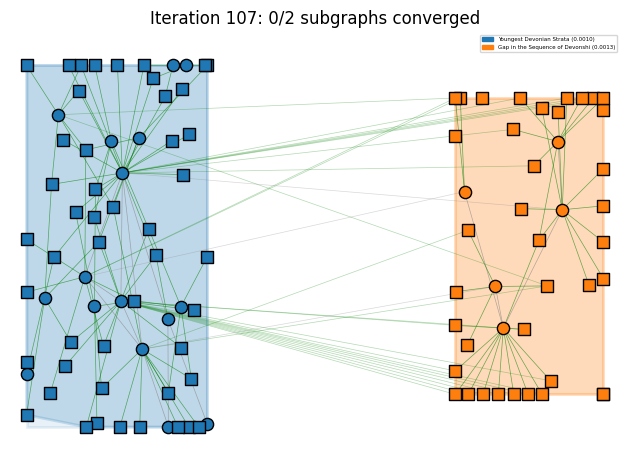

Saved frame 108 to ../Output_subgraphs\subgraph_layout_iter_0108.png


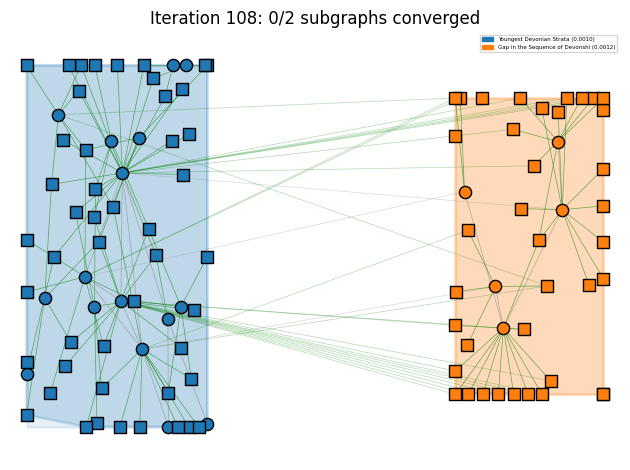

Saved frame 109 to ../Output_subgraphs\subgraph_layout_iter_0109.png


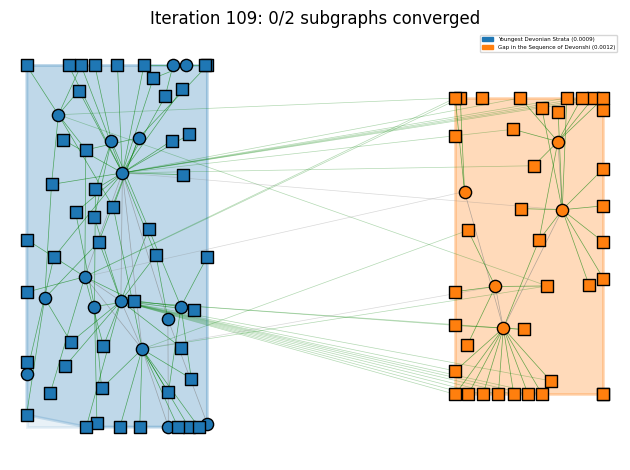

Saved frame 110 to ../Output_subgraphs\subgraph_layout_iter_0110.png


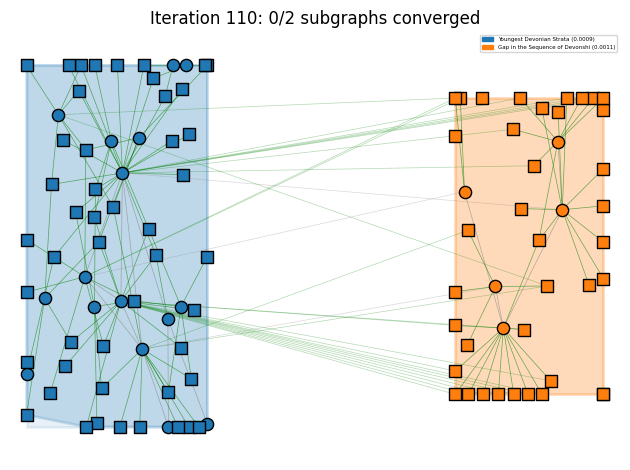

Saved frame 111 to ../Output_subgraphs\subgraph_layout_iter_0111.png


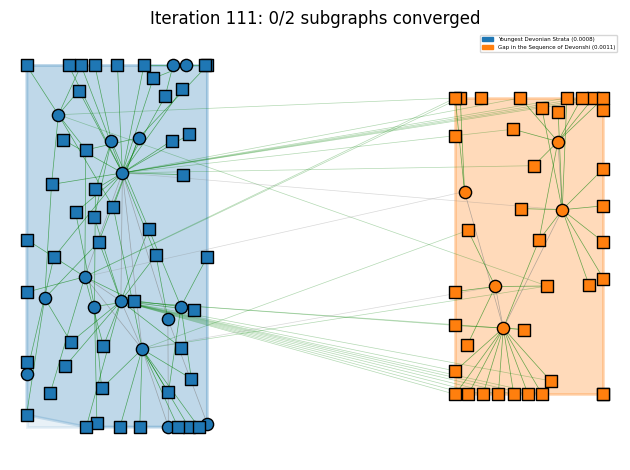

Saved frame 112 to ../Output_subgraphs\subgraph_layout_iter_0112.png


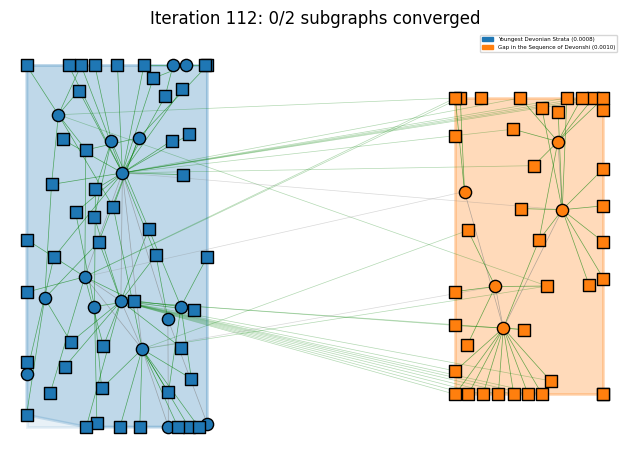

Saved frame 113 to ../Output_subgraphs\subgraph_layout_iter_0113.png


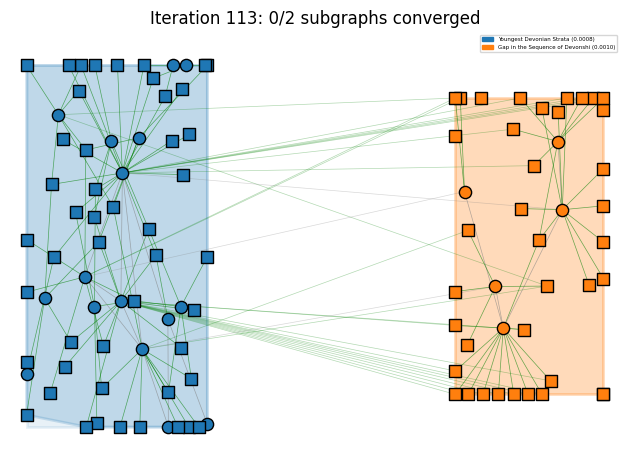

Saved frame 114 to ../Output_subgraphs\subgraph_layout_iter_0114.png


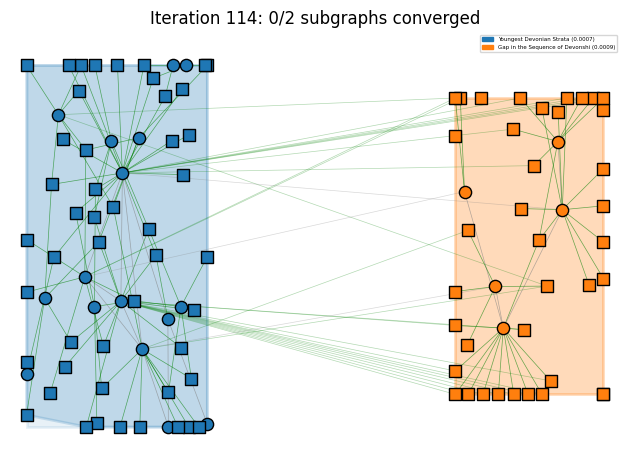

Saved frame 115 to ../Output_subgraphs\subgraph_layout_iter_0115.png


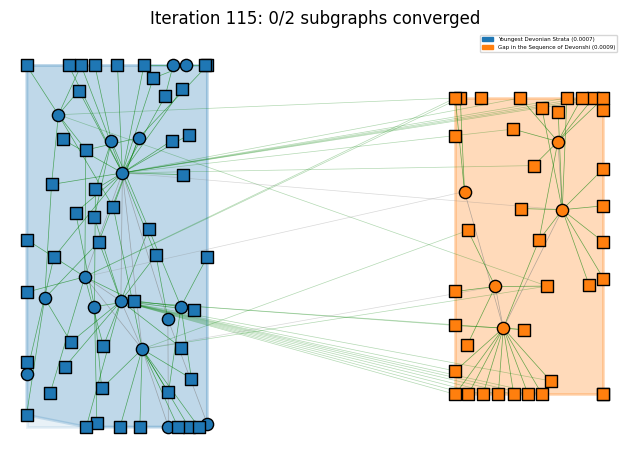

Saved frame 116 to ../Output_subgraphs\subgraph_layout_iter_0116.png


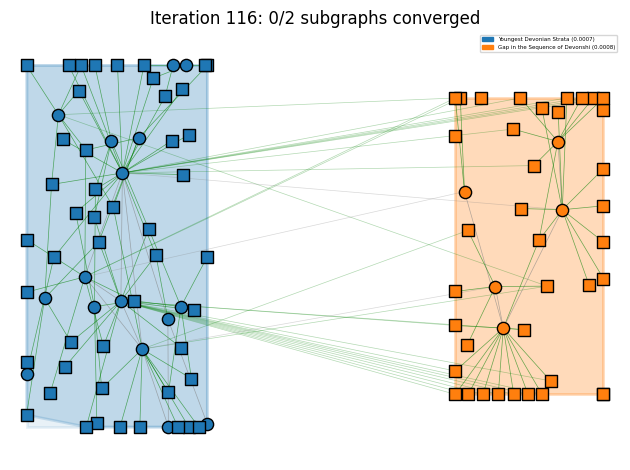

Saved frame 117 to ../Output_subgraphs\subgraph_layout_iter_0117.png


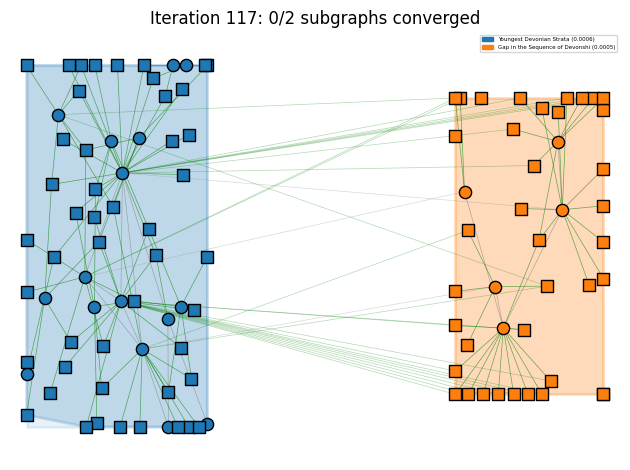

Saved frame 118 to ../Output_subgraphs\subgraph_layout_iter_0118.png


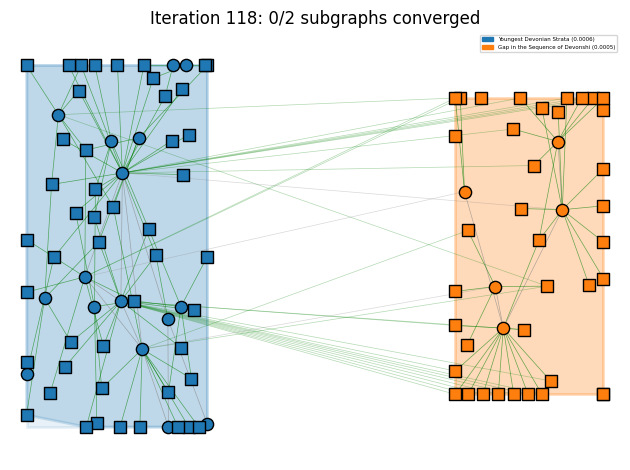

Subgraph 'Gap in the Sequence of Devonshi' converged at iteration 119 with max movement 0.000491
Saved frame 119 to ../Output_subgraphs\subgraph_layout_iter_0119.png


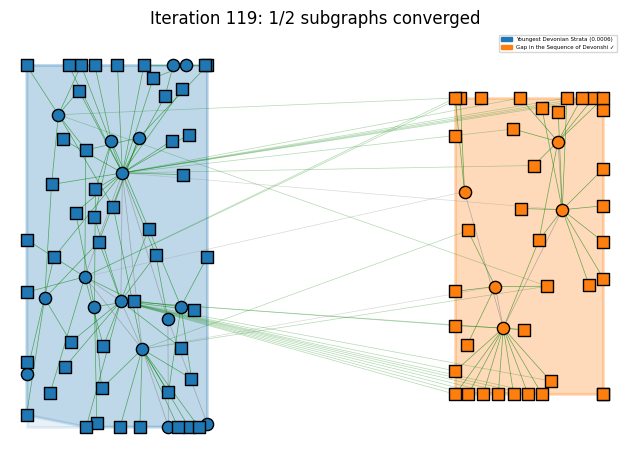

Saved frame 120 to ../Output_subgraphs\subgraph_layout_iter_0120.png


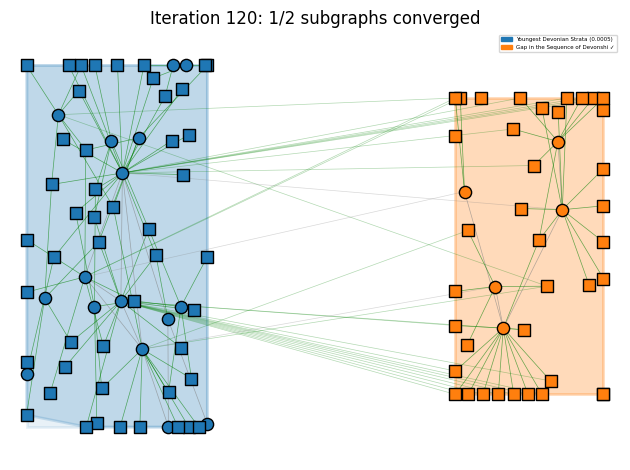

Saved frame 121 to ../Output_subgraphs\subgraph_layout_iter_0121.png


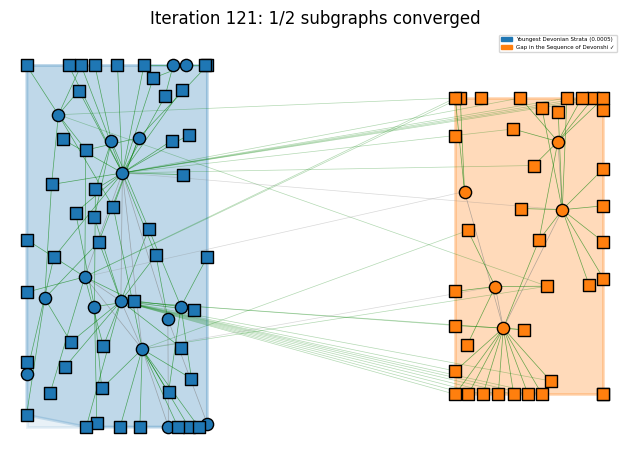

Subgraph 'Youngest Devonian Strata' converged at iteration 122 with max movement 0.000485
Saved final layout to devonshire_subgraphs_layout.png


<Figure size 640x480 with 0 Axes>

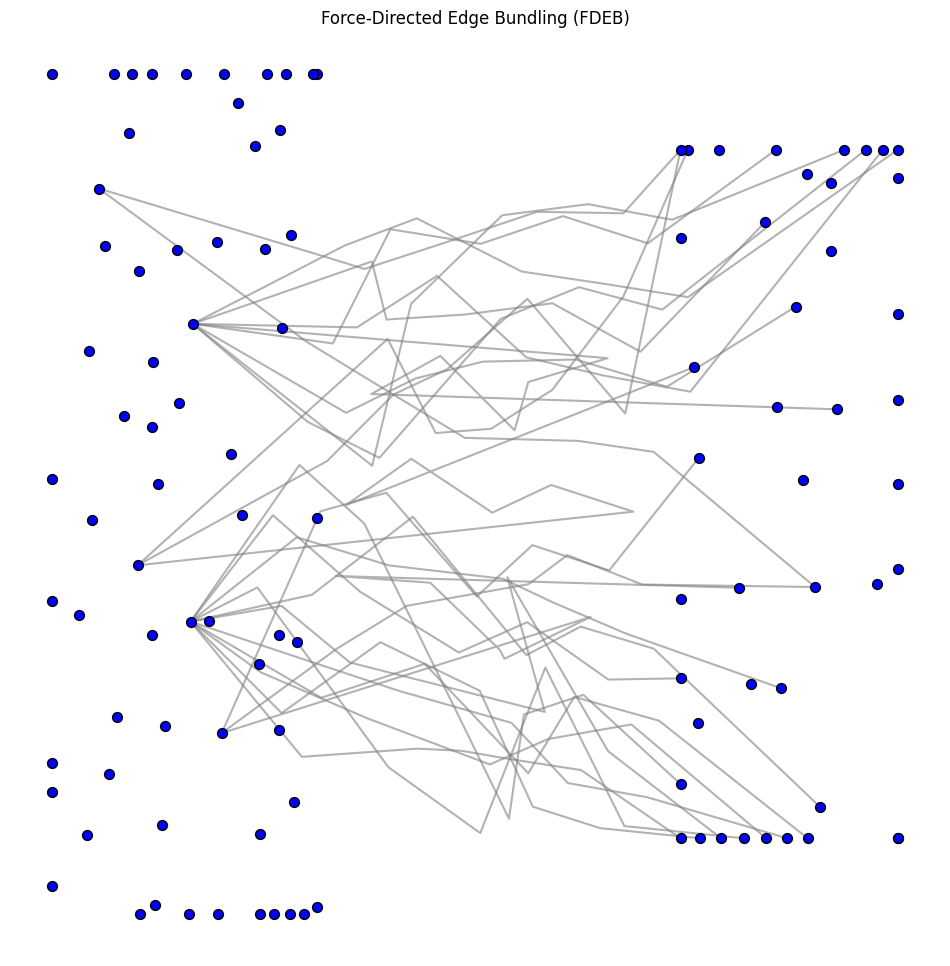

In [ ]:
# Example usage
dot_file_path = data_name_3
subgraph_names = ["Youngest Devonian Strata", "Gap in the Sequence of Devonshi"]

# Process the DOT file and get subgraphs data
subgraphs_data = process_dot_file_for_subgraphs(dot_file_path, subgraph_names)

# Visualize the subgraphs and get the graph and positions
G, pos = draw_colorful_FDG_FR_inertia_subgraphs(
    subgraphs_data,
    output_name="devonshire_subgraphs_layout.png",
    iterations=300,
    inertia=0.8,
    display_node_id=False,
    save_frames=True,
    output_dir="../Output_subgraphs",
    separation_factor=2.0,
    subgraph_spacing=1.5,
    convergence_threshold=0.0005
)

# Get nodes in each cluster
cluster1_nodes = [node for node, attrs in subgraphs_data['subgraphs'][subgraph_names[0]]]
cluster2_nodes = [node for node, attrs in subgraphs_data['subgraphs'][subgraph_names[1]]]

# Apply FDEB to inter-cluster edges
bundled_edges = apply_fdeb_to_inter_cluster_edges(G, pos, cluster1_nodes, cluster2_nodes, P=5, S=0.1, I=50, compatibility_threshold=0.6)

# Visualize the bundled edges
plt.figure(figsize=(12, 12))
plt.title("Force-Directed Edge Bundling (FDEB)")

# Draw nodes
for node in G.nodes():
    plt.scatter(pos[node][0], pos[node][1], s=50, color='blue', edgecolor='black', zorder=2)

# Draw bundled edges
for e, control_points in bundled_edges.items():
    xs, ys = zip(*control_points)
    plt.plot(xs, ys, color='gray', alpha=0.6, zorder=1)

plt.axis('off')
plt.show()
